<center><img src="https://minas.medellin.unal.edu.co/images/Escudo_color.png" width="300"></center>

### **<center> <h2><strong>Reconocimiento de señales de tránsito y semaforos</strong></h2> </center>**

<center> <t>Maria Paula Garzón<t> </center>
<center> <t>Juan Gabriel Góez Duque<t> </center>
<center> <t>Gustavo Gomez Morales<t> </center>
<center> <t>Madeleinne Paulina Henao García<t> </center>
<center> <t>Oscar David Pérez Quintero<t> </center>


# <center> <h2><strong>Introducción</strong></h2> </center>


<center> <h3><strong>Contexto</strong></h3> </center>
<p style='text-align: justify'>
     El objetivo es reconocer señales de tráfico utilizando técnicas de visión computacional como procesamiento de imágenes, así como el uso de redes neuronales convolucionales. Todo esto empleando la base de datos <a href="https://benchmark.ini.rub.de/">GTSRB</a> (German Traffic Sign Recognition Benchmark), que nos suministra miles de imágenes etiquetadas para entrenar modelos precisos y eficientes. Uno de los objetivo primordiales es diseñar y entrenar modelos de redes neuronales convolucionales (CNN), que puedan identificar y clasificar con precisión una amplia gama de señales de tránsito. Se contempla la recopilación de un extenso dataset que incluya imágenes de señales de tránsito bajo diversas condiciones de iluminación, clima y obstrucciones visuales, lo que permitirá al modelo entrenarse en escenarios que reflejen la complejidad del mundo real. 
<p>

<center> <h3><strong>Tecnologia usada</strong></h3> </center>
<p style='text-align: justify'>
    Este proyecto implementa tecnologías como Docker, Conda, Jupyter Notebook, JupyterLab, OpenCV y TensorFlow para asegurar compatibilidad y facilidad de manejo de versiones a través de una imagen de Docker basada en Conda. Configuramos un entorno virtual en Conda con todas las dependencias necesarias, permitiendo la ejecución en cualquier sistema operativo compatible con Docker. Centralizamos todas las funciones en un archivo llamado <a href="https://github.com/GGomezMorales/artificial_vision_project/blob/main/artificial-vision-project/util.py">util.py</a>, diseñado para claridad estructural del proyecto y facilidad de uso, empleando diversas bibliotecas para las operaciones y la lógica requerida. A pesar de la robustez en el manejo de errores y el diseño orientado a objetivos generales, las funciones aún necesitan ser documentadas.
<p>

<p style='text-align: justify'>
    Es importante destacar que todo el proceso se lleva a cabo dentro de un contenedor de Docker. Este contenedor está configurado para integrar un entorno Conda, que contiene todas las dependencias necesarias para el proyecto. Esta configuración permite el uso directo y eficiente del proyecto desde un IDE como Visual Studio Code.
<p>

<p style='text-align: justify'>
    <strong>¿Por qué usar Docker?</strong> Esta tecnología ofrece una plataforma consistente para el desarrollo, lo que elimina los problemas de <i>"funciona en mi máquina"</i> al garantizar que el software se ejecute de manera idéntica en cualquier entorno. Docker facilita la gestión de dependencias y la configuración necesaria para operar el proyecto, asegurando que todas las herramientas y librerías, como OpenCV y TensorFlow, funcionen en un entorno aislado y controlado.
<p>


# <center> <h3><strong>Adquisición de imágenes</strong></h3> </center>


<p style='text-align: justify'>
    El German Traffic Sign Recognition Benchmark (GTSRB) es un conjunto de datos fundamental para el desarrollo de sistemas de reconocimiento de señales de tráfico, esencial para aplicaciones como la conducción autónoma y los sistemas de asistencia al conductor. Tiene las siguientes propiedades:
<p>

<ul>
    <li>Problema de clasificación multiclase de una sola imagen</li>
    <li>Más de 40 clases</li>
    <li>Más de 50.000 imágenes en total</li>
    <li>Base de datos amplia y realista</li>
</ul>

<p style='text-align: justify'>
    GTSRB fue creado por el Instituto de Neuroinformática de la Universidad Ruhr de Bochum, Alemania, y se presentó oficialmente en 2011 durante una competencia en la Conferencia Internacional Conjunta sobre Redes Neuronales (IJCNN). Su objetivo es apoyar el desarrollo y la evaluación de sistemas automáticos para la detección y reconocimiento de señales de tráfico en condiciones reales.
<p>

<p style='text-align: justify'>
    El conjunto de datos contiene más de 50,000 imágenes y abarca 43 clases diferentes de señales de tráfico, que incluyen límites de velocidad, señales de advertencia y signos prohibitivos, entre otros. Las imágenes varían en tamaño, forma y apariencia, e incluyen desafíos como oclusiones parciales, diversas condiciones de iluminación y diferentes distancias y ángulos de captura de la cámara. Cada imagen está acompañada de anotaciones que especifican la clase y las coordenadas del cuadro delimitador de la señal dentro de la imagen.
<p>

<p style='text-align: justify'>
    El GTSRB se divide en un conjunto de entrenamiento con 39,209 imágenes y un conjunto de pruebas con 12,630 imágenes. Esto permite evaluar la eficacia de los modelos entrenados en un entorno controlado. Las anotaciones adicionales incluyen etiquetas de clase y coordenadas de cuadros delimitadores, que son cruciales para tareas de segmentación y reconocimiento.
<p>

<p style='text-align: justify'>
    
<p>


In [1]:
from util import *
from concurrent.futures import ThreadPoolExecutor
from IPython.display import clear_output

# Librerías requeridas
import numpy as np
import pandas as pd
import tensorflow as tf
import os

# Separar la data.
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

from PIL import Image

# Para la graficación
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap

# Para el módelo y su entrenamiento
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout

clear_output()

<p style='text-align: justify'>
    Creamos una carpeta denominada `/.kaggle` que se utiliza para almacenar las credenciales necesarias para interactuar con los datasets de Kaggle a través de la línea de comandos.
<p>


In [2]:
! mkdir -p /.kaggle
! cp res/kaggle.json /.kaggle/

clear_output()

<p style='text-align: justify'>
    Procedimos a descargar el archivo comprimido en una carpeta denominada `/datasets`. Una vez descargado, descomprimimos el contenido y, posteriormente, eliminamos el archivo comprimido para optimizar el espacio de almacenamiento.
<p>


In [3]:
! kaggle datasets download -d meowmeowmeowmeowmeow/gtsrb-german-traffic-sign -p /datasets
! cd /datasets && mkdir -p data-traffic-sign && cd data-traffic-sign && unzip /datasets/gtsrb-german-traffic-sign.zip
! rm /datasets/gtsrb-german-traffic-sign.zip
! wget https://gist.githubusercontent.com/GGomezMorales/5f92839d98ee7a0d2f2168007089adc9/raw/c16fab217c0d2673ca20598bf1208ef7ff570c06/sign_names.csv -P /datasets/data-traffic-sign

clear_output()

# Exploración del dataset

<p style='text-align: justify'>
Como todo proyecto, se necesita primero saber con qué se está trabajando, para esto se realiza una fase de exploración, un poco más visual, del dataset que se maneja.
<p>

## Cargar metadatos

In [4]:
# Path de los datos
inp_ds_path = '/datasets/data-traffic-sign'

In [5]:
# Leer los nombreas de las clases
sign_names=pd.read_csv(inp_ds_path + '/sign_names.csv')
sign_names.head()

,ClassId,SignName
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)


In [6]:
# Ejemplos de las 43 clases
meta_df=pd.read_csv(inp_ds_path+'/Meta.csv')
meta_df.head()

,Path,ClassId,ShapeId,ColorId,SignId
0,Meta/27.png,27,0,0,1.32
1,Meta/0.png,0,1,0,3.29
2,Meta/1.png,1,1,0,3.29
3,Meta/10.png,10,1,0,3.27
4,Meta/11.png,11,0,0,1.22


In [7]:
# Cargar el archivo CSV con las etiquetas del conjunto de prueba
y_test_csv = pd.read_csv(inp_ds_path + '/Test.csv')
y_test_csv.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,53,54,6,5,48,49,16,Test/00000.png
1,42,45,5,5,36,40,1,Test/00001.png
2,48,52,6,6,43,47,38,Test/00002.png
3,27,29,5,5,22,24,33,Test/00003.png
4,60,57,5,5,55,52,11,Test/00004.png


In [8]:
# Cargar el archivo CSV con las etiquetas del conjunto de entrenamiento
train_df=pd.read_csv(inp_ds_path+'/Train.csv')
train_df.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,27,26,5,5,22,20,20,Train/20/00020_00000_00000.png
1,28,27,5,6,23,22,20,Train/20/00020_00000_00001.png
2,29,26,6,5,24,21,20,Train/20/00020_00000_00002.png
3,28,27,5,6,23,22,20,Train/20/00020_00000_00003.png
4,28,26,5,5,23,21,20,Train/20/00020_00000_00004.png


## Graficar el histograma

### Crear las clases del histograma

In [9]:
# Crear un DataFrame para la distribución de datos en el conjunto de entrenamiento
data_distribution = pd.DataFrame(train_df['ClassId'].value_counts())
data_distribution = data_distribution.reset_index()

# Renombrar las columnas del DataFrame
data_distribution = data_distribution.rename(columns={'index':'ClassId'})

# Combinar los nombres de las señales con la distribución de datos por clase
data_distribution = data_distribution.merge(sign_names, how='inner', on='ClassId')

# Crear una columna combinada para el nombre de la señal y el ID de la clase
data_distribution['SignName_ClassId'] = data_distribution['SignName'] + ' [' + data_distribution['ClassId'].map(str) + ']'

### Visualización del histograma

/tmp/ipykernel_17/2072545129.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='SignName_ClassId', data=data_distribution, palette='viridis')


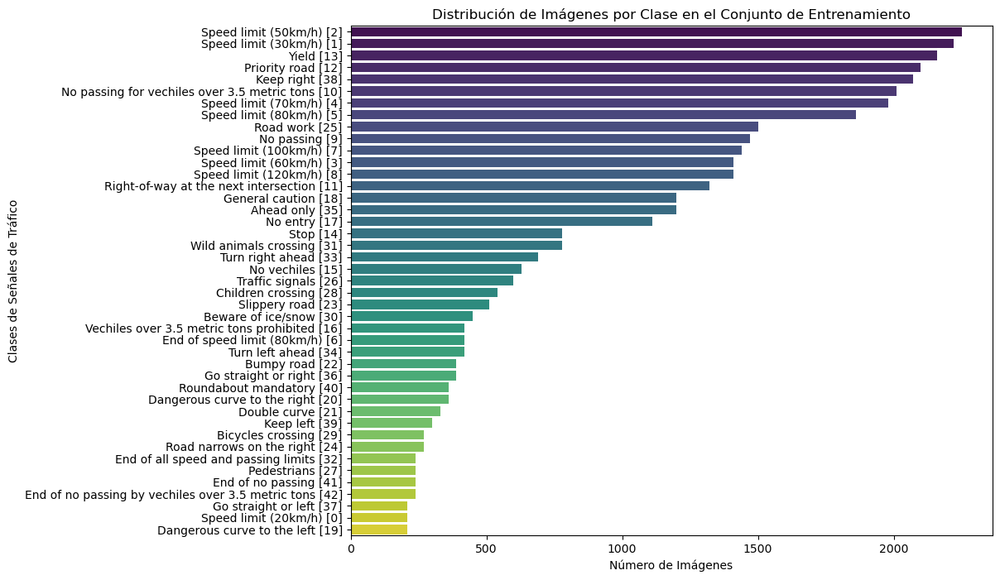

In [10]:
# Graficar el histograma utilizando seaborn
plt.figure(figsize=(10, 8))
sns.barplot(x='count', y='SignName_ClassId', data=data_distribution, palette='viridis')
plt.title('Distribución de Imágenes por Clase en el Conjunto de Entrenamiento')
plt.xlabel('Número de Imágenes')
plt.ylabel('Clases de Señales de Tráfico')
plt.show()

## Visualizar las imágenes de las clases

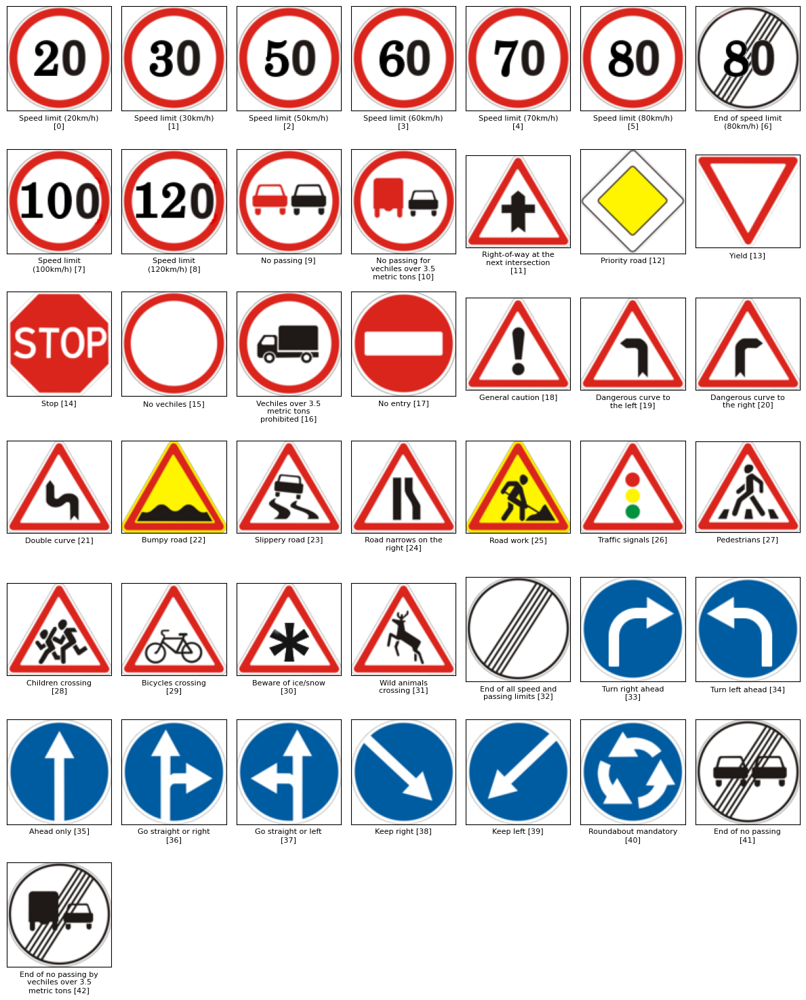

In [11]:
# Configurar el tamaño de la figura
plt.figure(figsize=(12, 15))

# Bucle para mostrar las imágenes de las 43 clases
for i in range(43):
    # Crear subgráficos: 7 filas por 7 columnas (máximo 49 gráficos, pero aquí son 43)
    plt.subplot(7, 7, i + 1)
    
    # Definir la ruta de la imagen según el número de clase
    temp_path = os.path.join(inp_ds_path, 'Meta', f'{i}.png') 
    im = Image.open(temp_path)  # Abrir la imagen de la clase actual
    
    # Mostrar la imagen
    plt.imshow(im)
    
    # Eliminar la cuadrícula a la imagen
    plt.grid(False)  
    
    # Obtener el nombre de la clase correspondiente desde el DataFrame
    s_name = data_distribution[data_distribution['ClassId'] == i]['SignName_ClassId'].values[0]
    
    # Ajustar el nombre de la clase para que se divida en líneas si es muy largo (máximo 20 caracteres por línea)
    s_name = '\n'.join(wrap(s_name, 20))
    
    # Remover los ticks (marcas) de los ejes X e Y para una mejor visualización
    plt.tick_params(
        axis='both',        # Aplicar cambios a ambos ejes (X e Y)
        which='both',       # Afectar tanto ticks mayores como menores
        bottom=False, top=False, labelbottom=False,  # Ocultar ticks en el eje X
        right=False, left=False, labelleft=False     # Ocultar ticks en el eje Y
    )
    
    # Añadir el nombre de la clase debajo de cada imagen
    plt.xlabel(s_name, fontsize=8)

# Mostrar la figura completa con las imágenes
plt.tight_layout()  # Ajustar el espaciado entre los subgráficos automáticamente para evitar solapamientos
plt.show()

## Conclusiones de la exploración de los datos

<p style='text-align: justify'>
Como lo demostró el histograma, es un dataset que tiene un claro desequilibrio en la cantidad de datos por clase. Por ejemplo la clase 2 (Speed limit over 30 Km/h) tiene casi 2500 imagenes, por el contrario, la clase 19 (Dangerous curve to the left), tiene poco menos de 250 imágenes. Esto puede ocasionar dificultades a la hora de realizar el entrenamiento del modelo, ya que puede favorecer a las clases con mayores datos o puede sesgar las métricas, como por ejemplo, la precisión global. 
<p> 



# <center> <h3><strong>Preprocesamiento de las imágenes</strong></h3> </center>

<p style='text-align: justify'>
    
<p>


<p style='text-align: justify'>
    Implementaremos varios métodos de preprocesamiento de manera individual para evaluar su impacto y eficacia en la mejora de nuestras imágenes. Posteriormente, integraremos los métodos más efectivos en una secuencia optimizada para lograr el mejor resultado posible. Los datos favorables obtenidos de cada método serán almacenados en arrays, lo que nos permitirá utilizarlos en etapas posteriores del análisis.
<p>


### **Imágenes de prueba**

<p style='text-align: justify'>
    Cargamos y mostramos las imágenes que se utilizarán en el análisis, disponibles tanto en formato RGB como en escala de grises para facilitar diferentes tipos de evaluación. Estas imágenes se han elegido al azar de nuestro dataset.
<p>


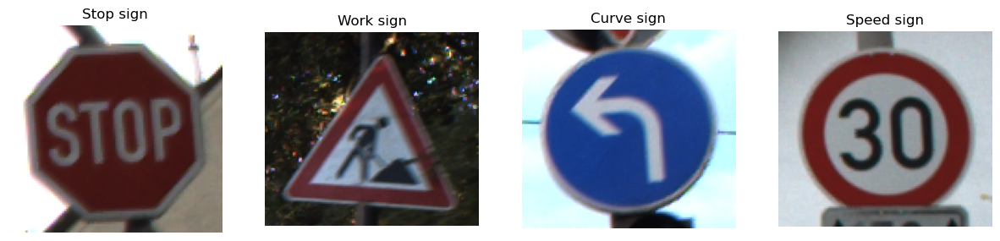

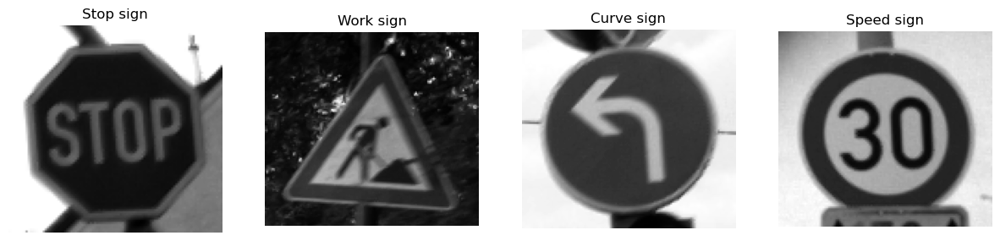

In [12]:
images_info = [
    {"name": "Stop sign", "path": "images/00093.png"},
    {"name": "Work sign", "path": "images/00153.png"},
    {"name": "Curve sign", "path": "images/00433.png"},
    {"name": "Speed sign", "path": "images/00284.png"}
]

original_images, original_images_gray, image_names = read_images(images_info)

# Remember to add the traffic light images

subplot_images(
    images=original_images,
    image_names=image_names
)

subplot_images(
    images=original_images_gray,
    image_names=image_names
)

<p style='text-align: justify'>
    Las imágenes analizadas presentan una baja resolución, variando entre 50x50 y 300x300 píxeles, y en muchos casos muestran altos niveles de ruido y falta de nitidez. Además, la iluminación es insuficiente, lo que afecta aún más su calidad visual. Para abordar estos problemas, se aplicarán diversas técnicas avanzadas, incluyendo filtros para suavizado y eliminación de ruido, correcciones de iluminación, ajustes basados en histogramas y métodos específicos para mejorar la nitidez y la resolución de las imágenes.
<p>


### **Eliminación de ruido**

<p style='text-align: justify'>
    Inicialmente, implementaremos un filtro promedio no local para reducir el ruido, con el objetivo principal de mejorar la resolución y eliminar el ruido de las imágenes.
<p>


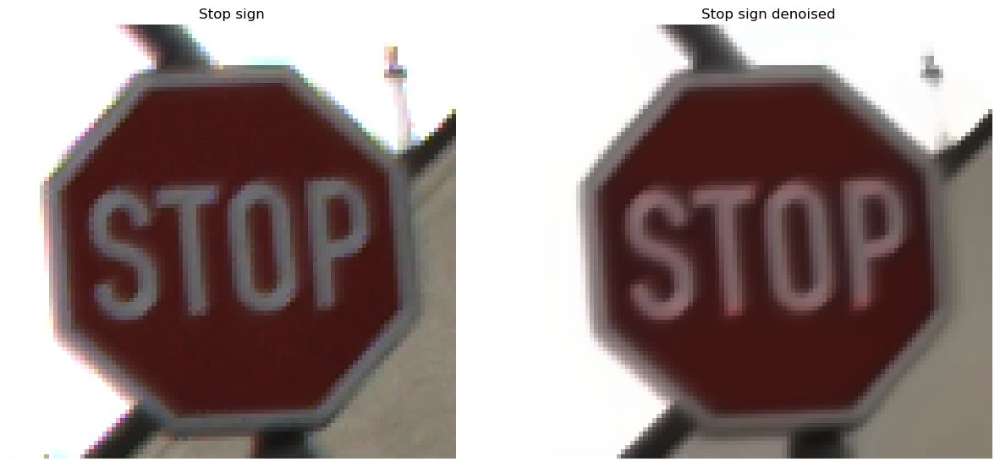

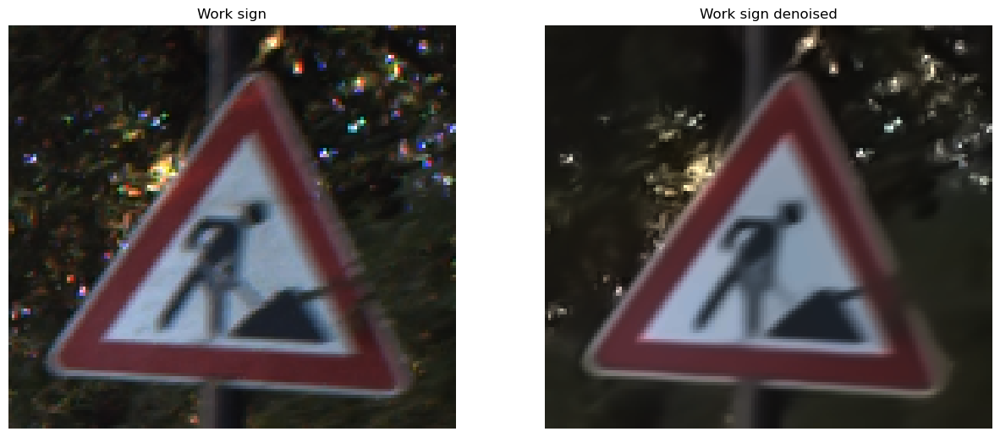

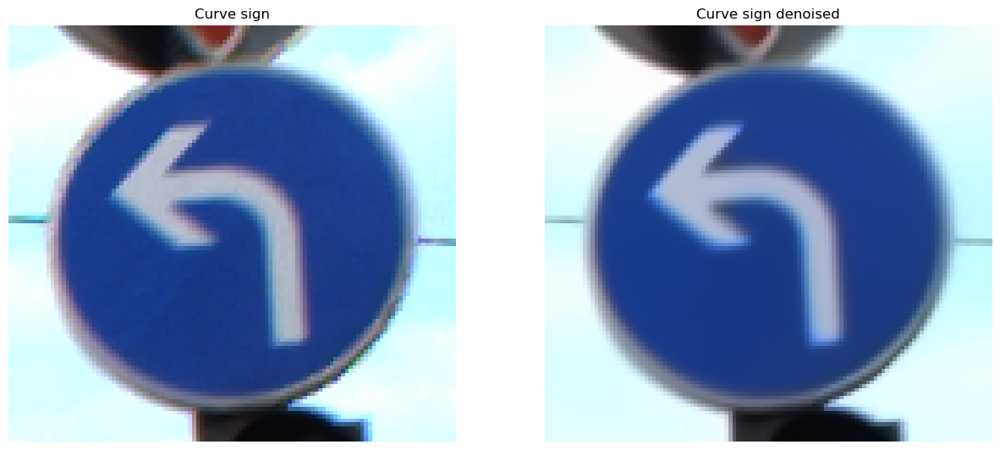

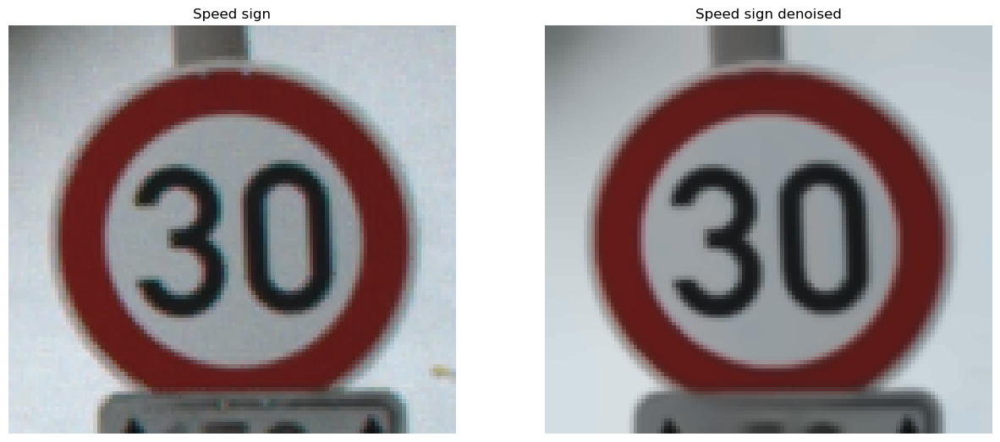

In [13]:
denoised_images = list(
    map(
        lambda image: reduce_noise(image, 10, 10, 7, 21),
        original_images
    )
)

for i in range(4):
    subplot_images(
        images=[original_images[i], denoised_images[i]],
        image_names=[image_names[i], f"{image_names[i]} denoised"]
    )

<p style='text-align: justify'>
    Observamos una gran mejora en las imágenes almacenadas en <code>denoised_images</code>. Las imágenes se ven mucho más limpias, con una reducción significativa del ruido, lo que nos proporciona un mejor resultado y un punto de partida más adecuado para trabajar.
<p>


### **Mejorar la resolución**

<p style='text-align: justify'>
    Aplicaremos una técnica avanzada basada en redes neuronales residuales para la superresolución de imágenes. Estos modelos son capaces de mejorar la calidad de imágenes borrosas o de baja resolución. Utilizan técnicas especiales que permiten a la red aprender a agregar detalles y mejorar la nitidez de las imágenes de manera eficiente. En nuestro caso, utilizaremos el modelo preentrenado EDSR.
<p>

<p style='text-align: justify'>
    El primer paso consiste en descargar el modelo.
<p>


In [40]:
! wget -P ~/ https://github.com/Saafke/EDSR_Tensorflow/raw/master/models/EDSR_x2.pb

clear_output()

<p style='text-align: justify'>
    Para optimizar la ejecución del modelo preentrenado, aplicamos funciones de concurrencia y técnicas de vectorización de datos. Utilizando <code>ThreadPoolExecutor</code>, paralelizamos el proceso de mejora de resolución de las imágenes, lo que permite una ejecución más rápida y eficiente. De esta manera, cada imagen es procesada simultáneamente, mejorando significativamente el rendimiento.
<p>


In [41]:
with ThreadPoolExecutor() as executor:
    enhanced_images_resolution = list(
        executor.map(
            lambda image: enhance_resolution(image, 2, '/root/EDSR_x2.pb'),
            original_images
        )
    )

clear_output()

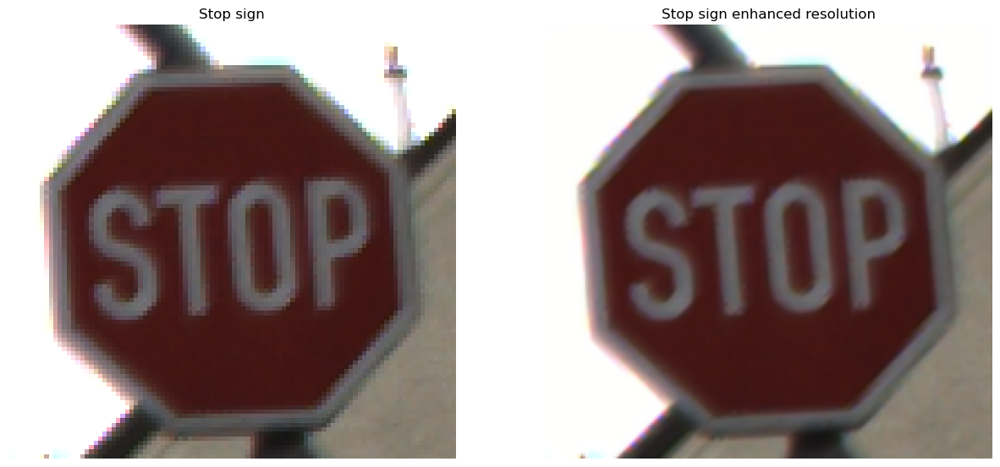

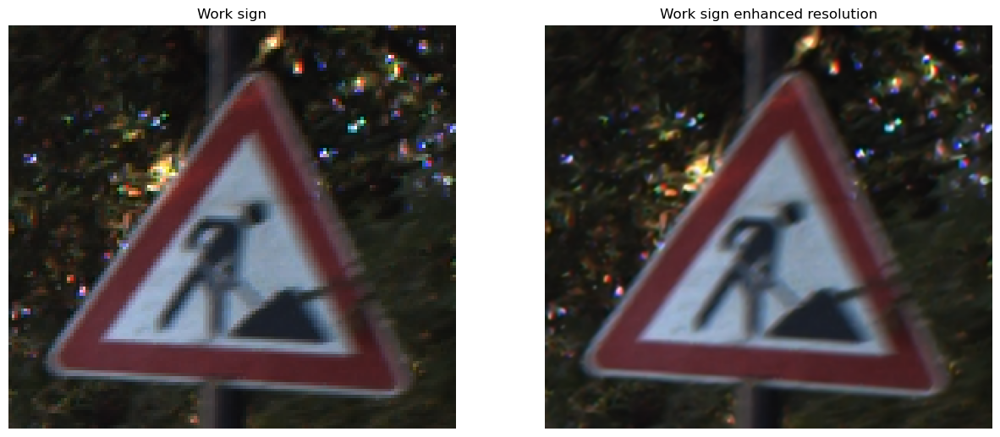

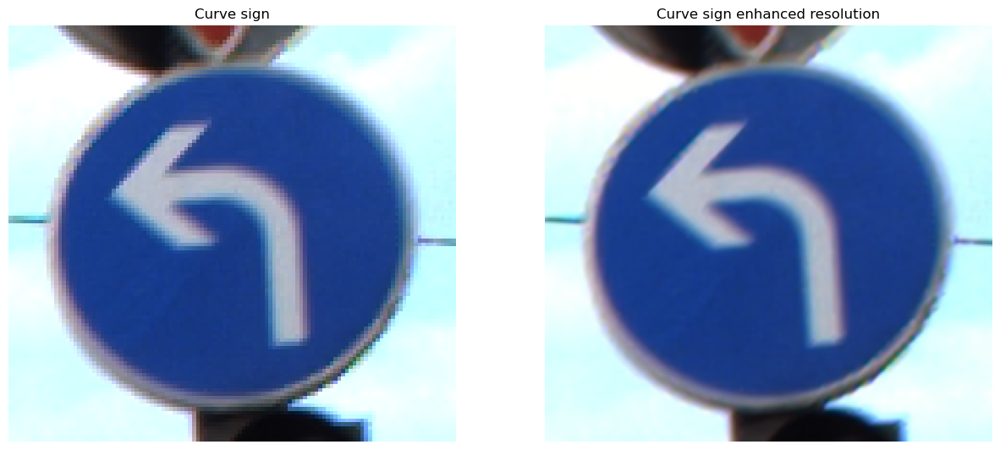

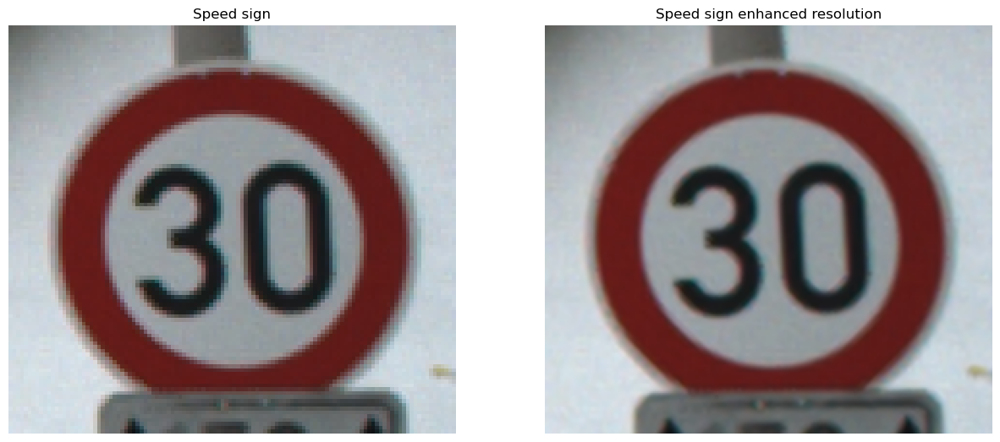

In [42]:
for i in range(len(images_info)):
    subplot_images(
        images=[original_images[i], enhanced_images_resolution[i]],
        image_names=[image_names[i], f"{image_names[i]} enhanced resolution"]
    )


In [60]:
print(original_images[0].shape)
print(enhanced_images_resolution[0].shape)

(97, 100, 3)
(194, 200, 3)


<p style='text-align: justify'>
    Podemos observar que las imágenes almacenadas en <code>enhanced_images_resolution</code> tienen una resolución significativamente mejorada en comparación con las imágenes originales. De hecho, la resolución se ha incrementado y el número de píxeles se ha duplicado utilizando esta técnica, lo que representa nuestro primer gran resultado hasta el momento.
<p>


### **Punto de partida (Imágenes)**

<p style='text-align: justify'>
    Hasta aquí, podemos trabajar con las imágenes obtenidas al aplicar estas dos técnicas iniciales. A partir de esto, analizaremos otras técnicas para ver si encontramos mejoras en la calidad o si estas dos son suficientes.
<p>

<p style='text-align: justify'>
    Primero, usaremos las imágenes almacenadas en <code>enhanced_images_resolution</code>, las cuales, como vimos anteriormente, tienen una mejor resolución, para aplicarles la función <code>reduce_noise</code> y así eliminar el ruido. Estas imágenes se almacenarán en <code>initial_images</code> y serán utilizadas como punto de partida en otras técnicas y métodos que estudiaremos para mejorar aún más la calidad de la imagen.
<p>


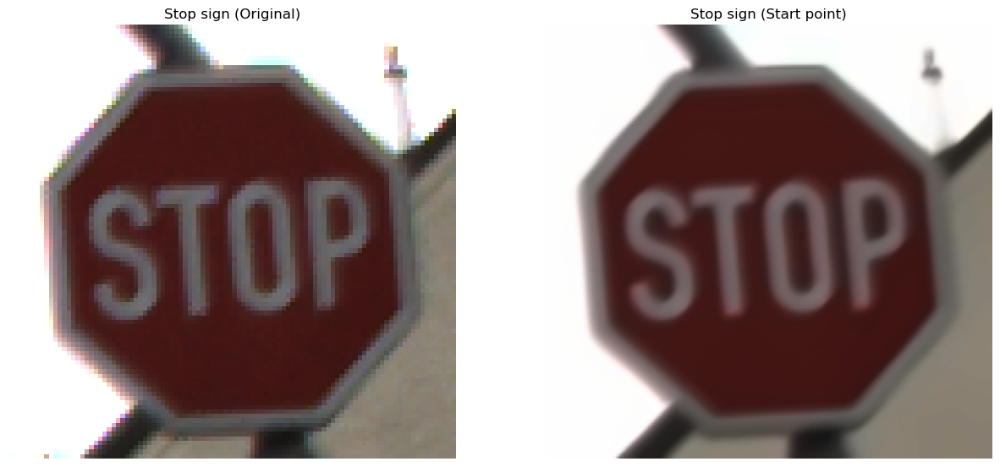

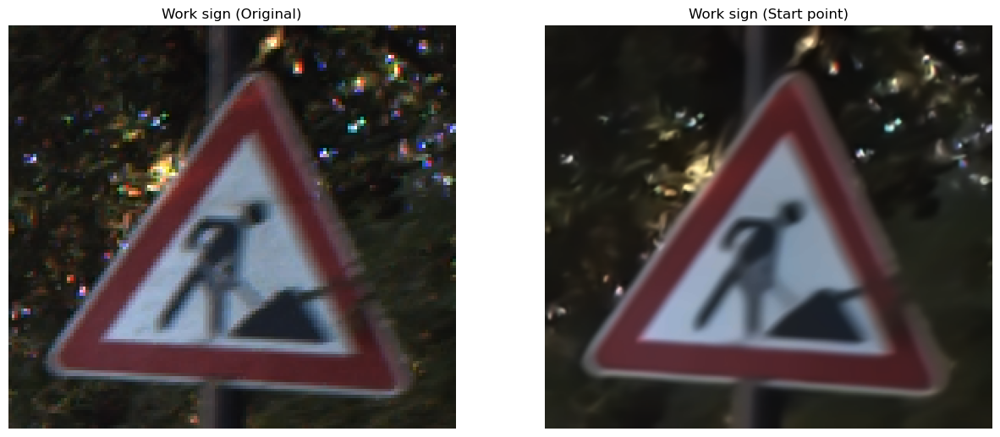

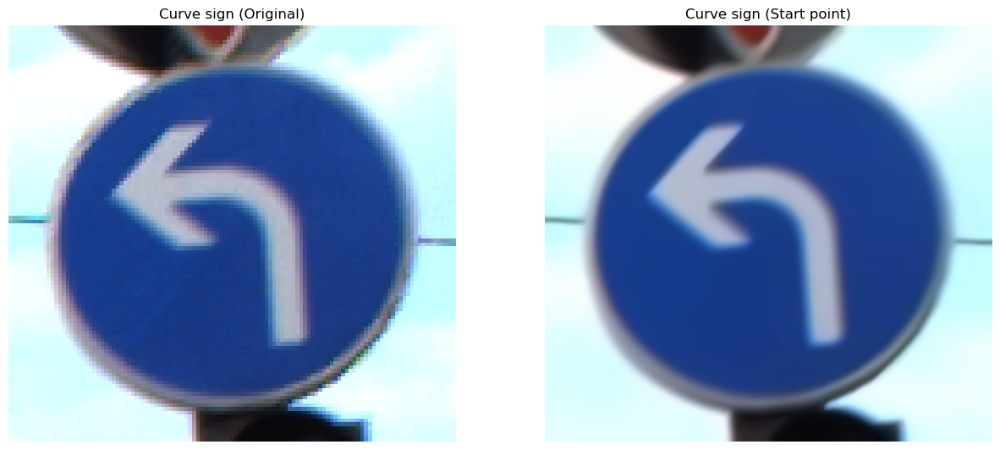

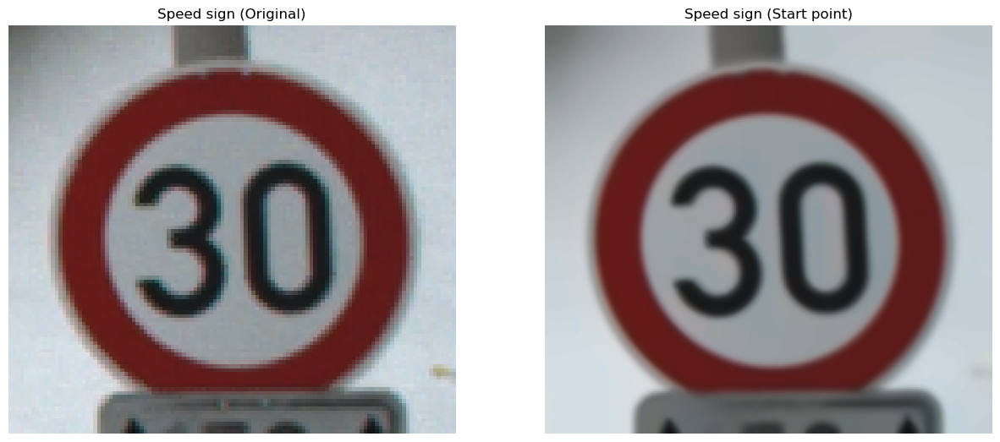

In [43]:
initial_images = list(
    map(
        lambda image: reduce_noise(image, 10, 10, 9, 25),
        enhanced_images_resolution
    )
)

for i in range(len(images_info)):
    subplot_images(
        images=[original_images[i], initial_images[i]],
        image_names=[
            f"{image_names[i]} (Original)", f"{image_names[i]} (Start point)"]
    )

### **Espacio de colores**

<p style='text-align: justify'>
    Exploraremos diversos espacios de color en una de las imagenes para determinar su utilidad en nuestro análisis.
<p>


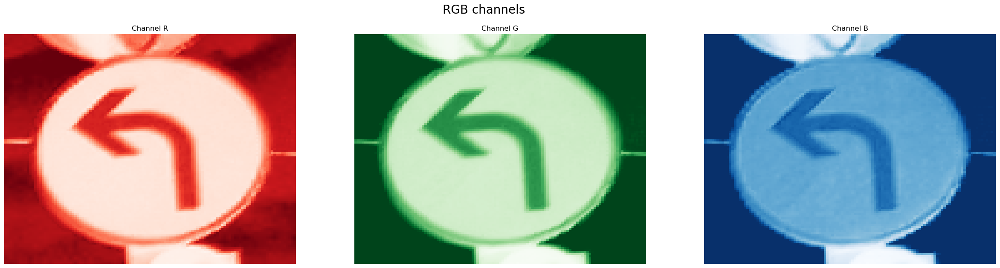

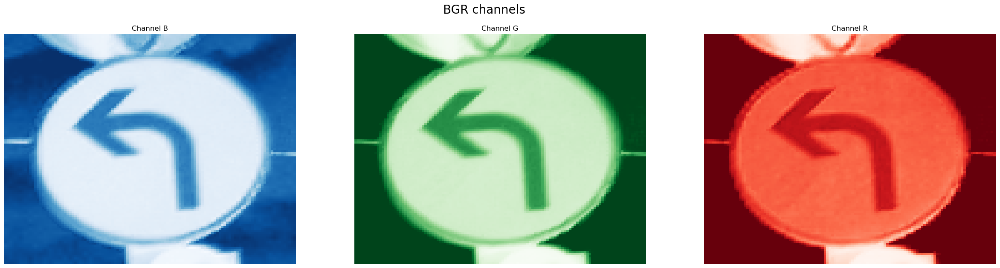

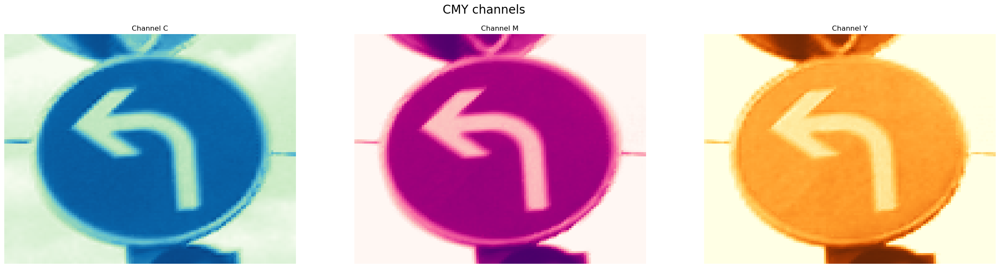

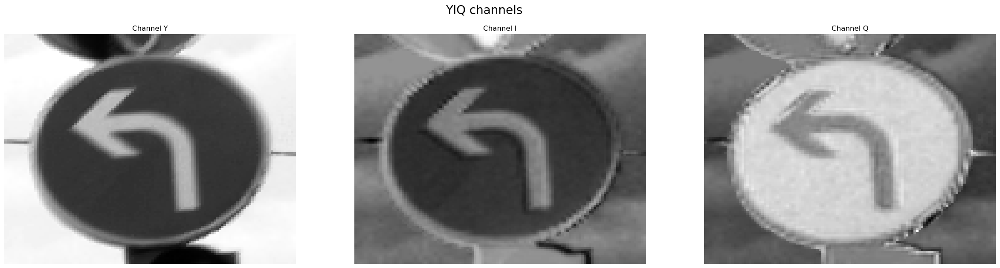

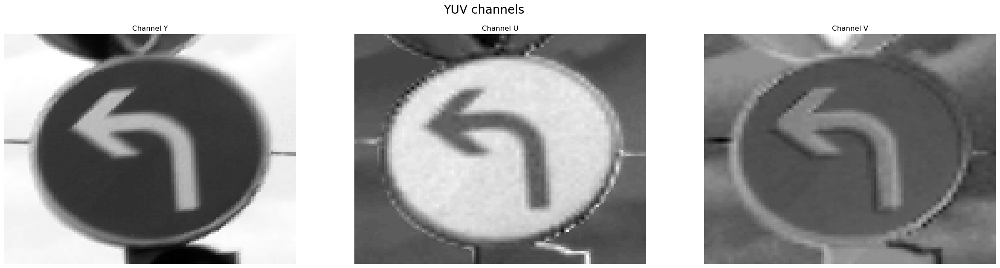

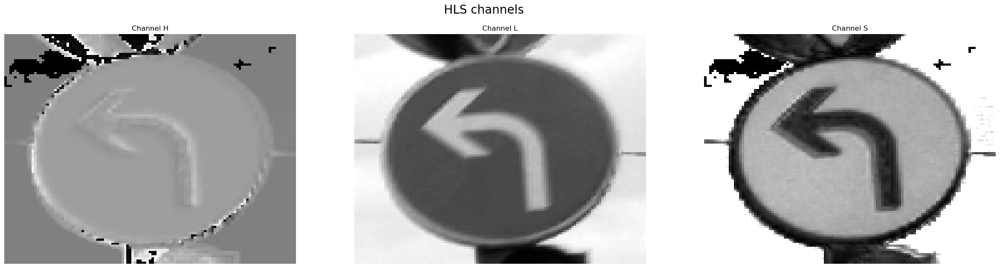

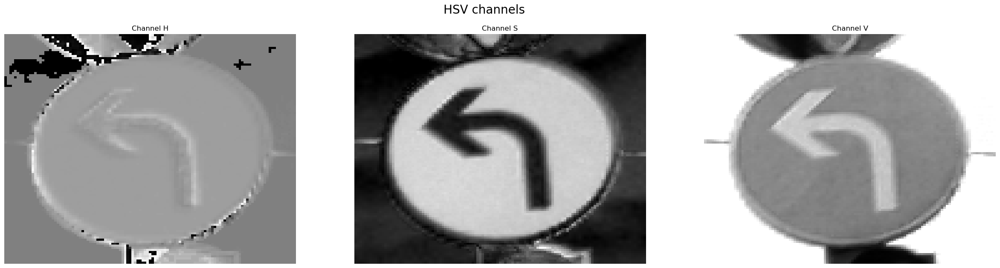

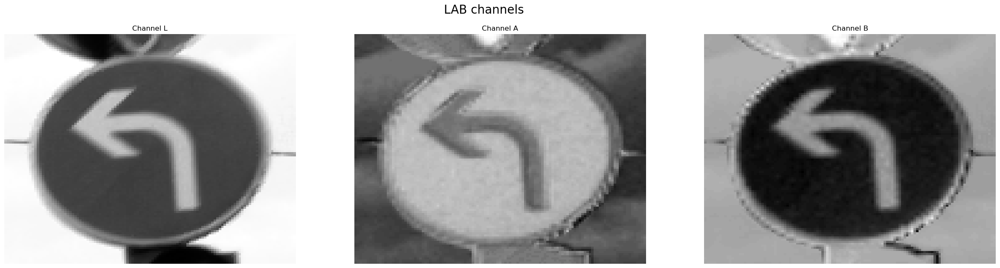

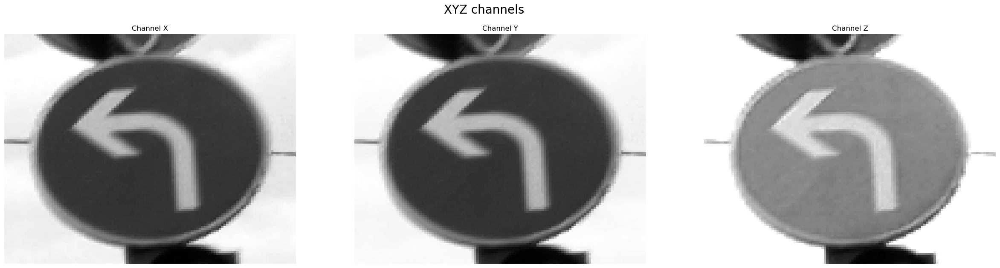

In [44]:
color_space = ["rgb", "bgr", "cmy", "yiq", "yuv", "hls", "hsv", "lab", "xyz"]
for mode in color_space:
    image = read_image('./images/00433.png', mode=mode)
    plot_channels(
        image=image,
        mode=mode,
        title=f"{mode.upper()} channels"
    )

<p style='text-align: justify'>
    Como resultado de nuestra evaluación, identificamos que, aunque diversos espacios de color pueden contribuir a nuestro análisis, no son suficientes para alcanzar los resultados óptimos. Entre los espacios y canales evaluados, el canal Y del espacio de color YIQ, que representa la luminancia o componente de brillo de la imagen, mostró potencial. Sin embargo, hemos decidido descartar esta técnica para nuestro análisis específico, dado que no se alinea completamente con nuestros objetivos de procesamiento de imagen.
<p>

<p style='text-align: justify'>
    Por ello, decidimos enfocarnos en otras técnicas que incluyen procesos de restauración, filtrado y transformación para mejorar la calidad de las imágenes.
<p>


### **Histograma**


<p style='text-align: justify'>
    Analizaremos cómo los histogramas pueden contribuir a nuestro análisis. Queremos determinar si la manipulación de los histogramas puede mejorar la calidad de las imágenes.
<p>


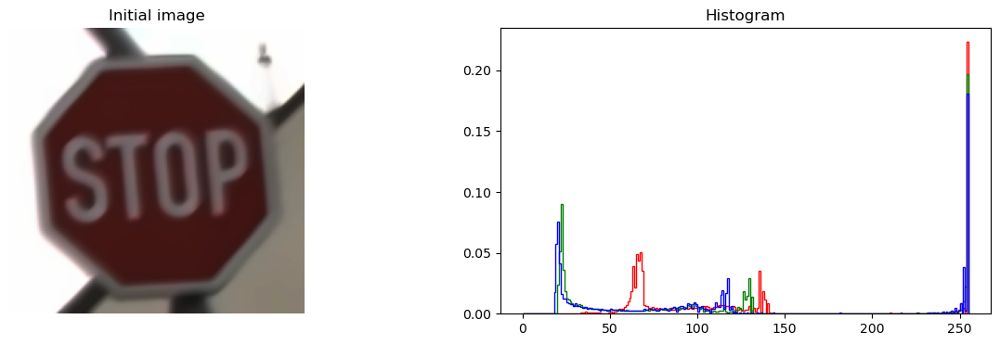

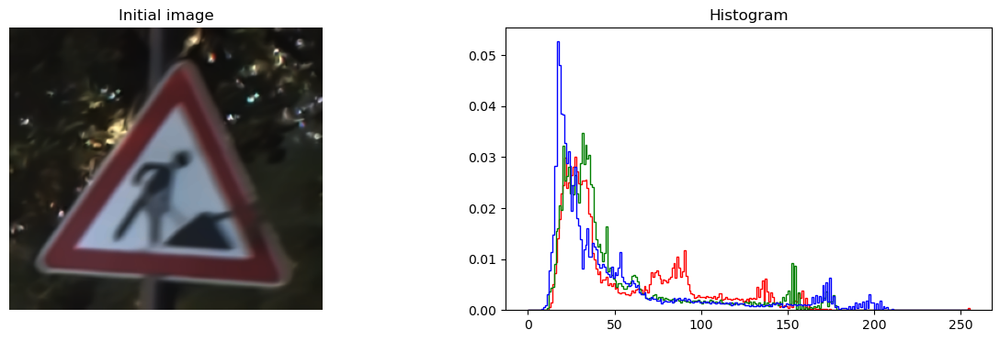

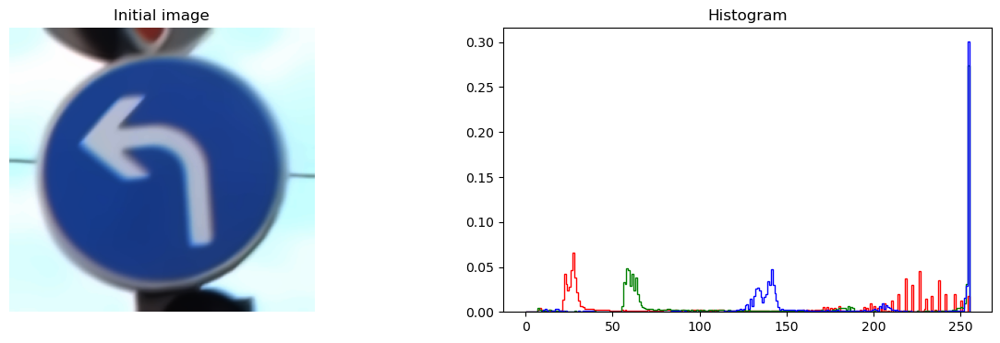

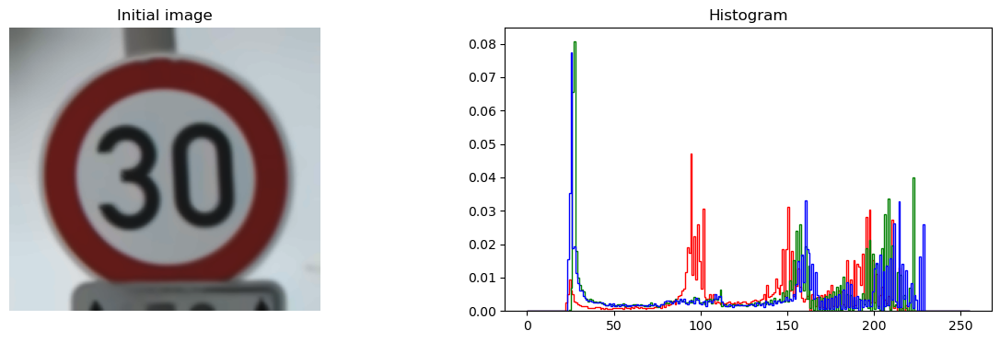

In [45]:
for image in initial_images:
    plot_image_and_histogram(
        image,
        image_title="Initial image",
        hist_title="Histogram"
    )

<p style='text-align: justify'>
    No observamos una correlación clara entre las imágenes y sus histogramas. Por ello, intentaremos realizar operaciones de expansión y ecualización de los histogramas para analizar si logramos alguna mejora en la calidad de las imágenes.
<p>


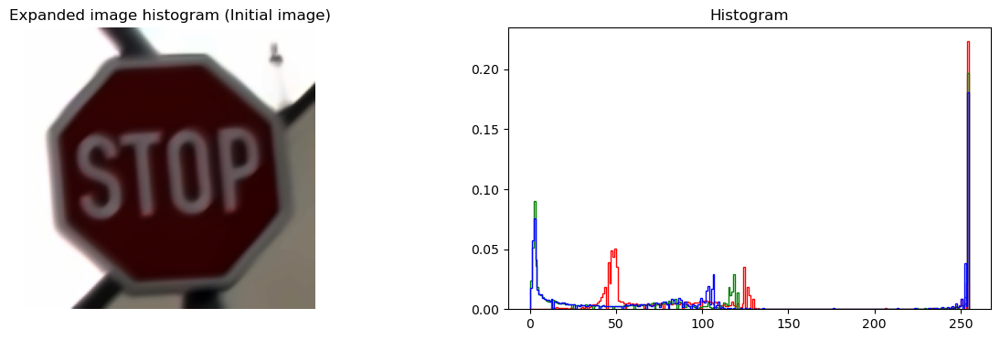

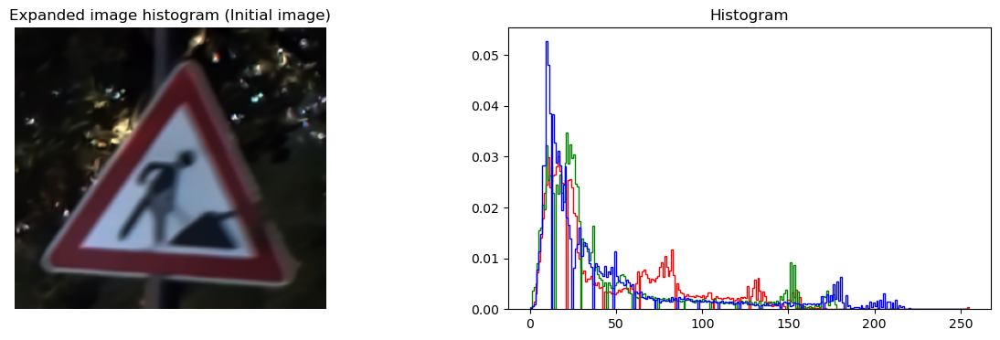

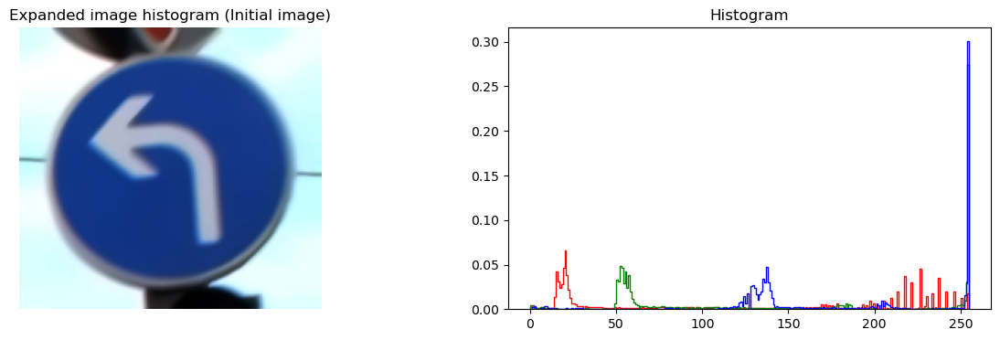

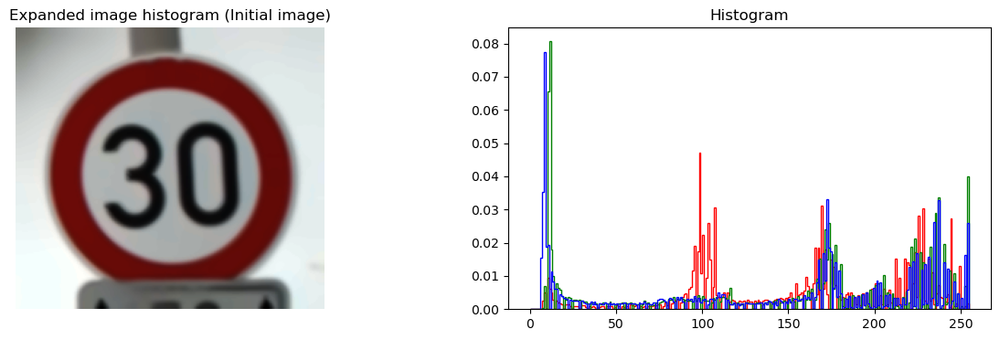

In [46]:
for images in initial_images:
    expanded_image = histogram_expansion(images)
    plot_image_and_histogram(
        expanded_image,
        image_title="Expanded image histogram (Initial image)",
        hist_title="Histogram"
    )

<p style='text-align: justify'>
    Con esta ampliación no vemos una mejora representativa o significativa, por lo que podemos descartar esta técnica.
<p>


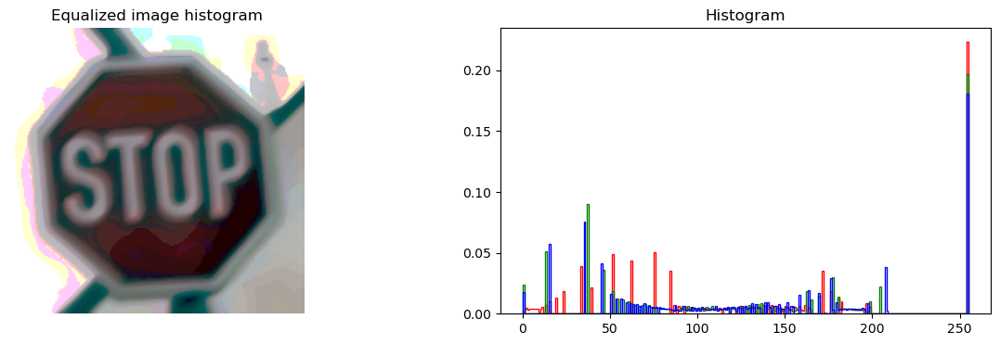

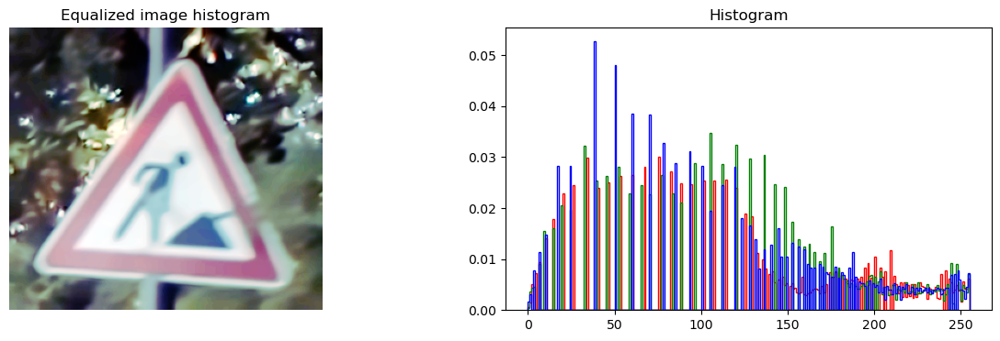

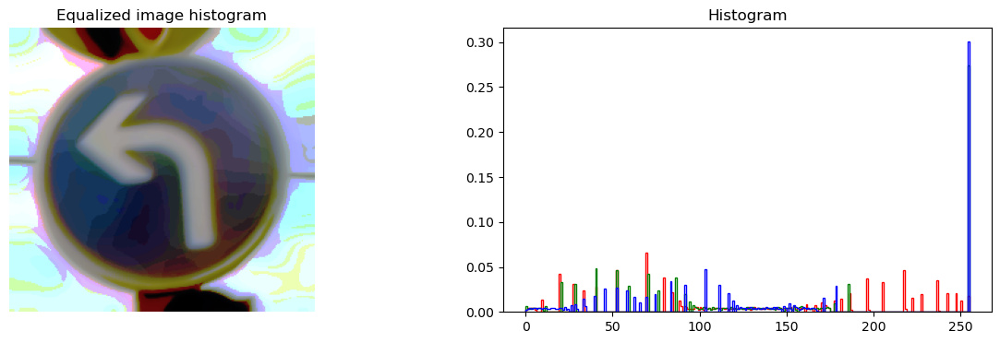

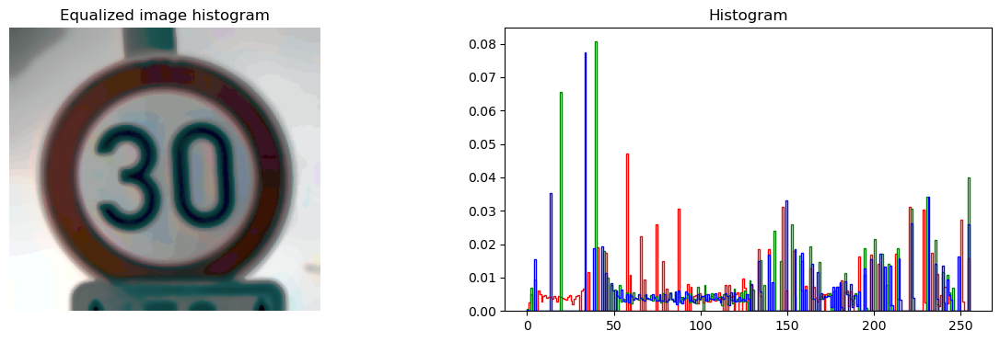

In [47]:
for image in initial_images:
    equalized_histogram = apply_transformation(image, equalize_histogram, [])
    plot_image_and_histogram(
        equalized_histogram,
        image_title="Equalized image histogram",
        hist_title="Histogram"
    )

<p style='text-align: justify'>
    Al aplicar la ecualización, observamos que la calidad de las imágenes disminuye, llenándose de manchas y empeorando significativamente. Por lo tanto, descartamos las operaciones de histograma y decidimos no utilizar esta técnica.
<p>


### **Filtrado**

<p style='text-align: justify'>
    Aplicaremos diversos filtros sobre las imágenes para evaluar su comportamiento mediante diferentes métodos de filtrado.
<p>


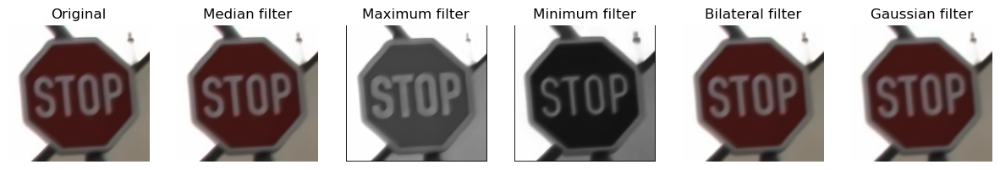

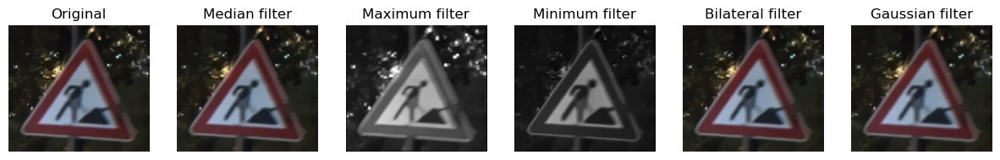

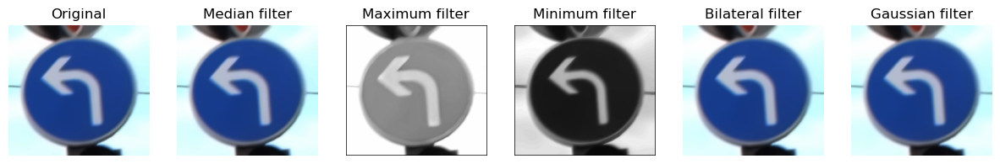

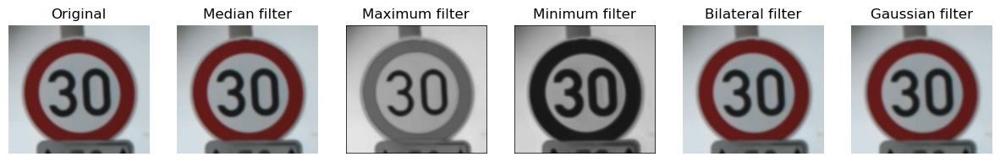

In [48]:
for image in initial_images:
    size = 3
    subplot_images(
        images=[
            image,
            median_filter(image, size),
            maximum_filter(image, size),
            minimum_filter(image, size),
            bilateral_filter(image, size, 250, 250),
            gaussian_filter(image, size, 250),
        ],
        image_names=[
            "Original",
            "Median filter",
            "Maximum filter",
            "Minimum filter",
            "Bilateral filter",
            "Gaussian filter",
        ]
    )

<p style='text-align: justify'>
    Tras un análisis detallado, observamos que los filtros aplicados no produjeron cambios significativos en las imágenes, con la excepción de los filtros mínimos y máximos.
<p>


### **Corrección gamma**

<p style='text-align: justify'>
    Usamos la transformación gamma para mejorar el contraste de las imágenes y realzar algunos detalles. Esta técnica ajusta el brillo y el contraste mediante dos parámetros: <code>a</code> y <code>&gamma;</code>. El parámetro <code>a</code> es un factor de escala que controla el contraste de la imagen, mientras que <code>&gamma;</code> ajusta la curva de brillo, afectando cómo se distribuyen los tonos oscuros y claros en la imagen. Iteramos estos parámetros con el objetivo de observar cómo su combinación puede influir en la mejora de nuestras imágenes. Para ello, variamos un parámetro mientras mantenemos el otro estático y viceversa. Esto nos proporcionará una buena aproximación para escoger los parámetros apropiados para nuestras imágenes.
<p>


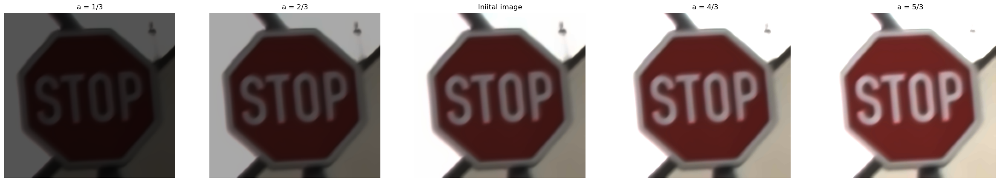

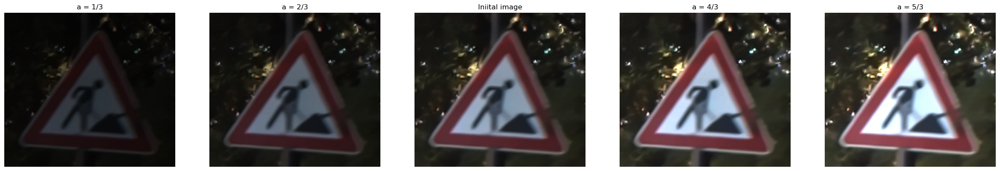

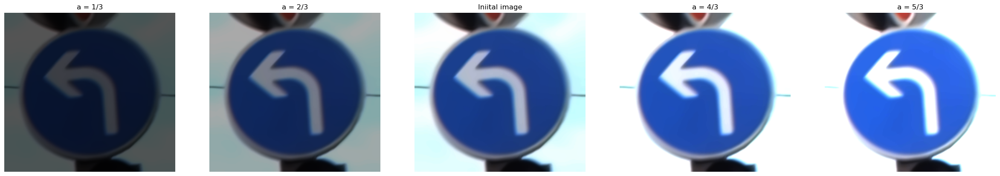

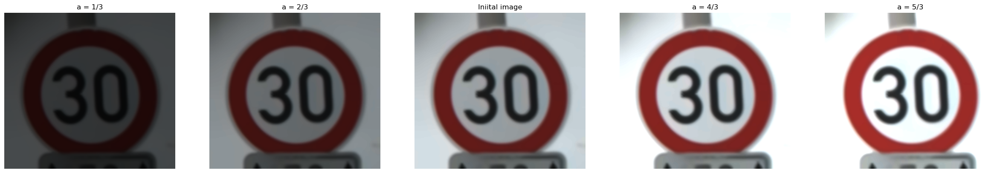

In [49]:
for image in initial_images:
    a_tested_images = []
    a_image_names = [
        "a = 1/3",
        "a = 2/3",
        "Iniital image",
        "a = 4/3",
        "a = 5/3"
    ]
    for i in range(1, 6):
        image_result = apply_transformation(
            image, gamma_correction, [i/3, 1])
        a_tested_images.append(image_result)
    subplot_images(
        images=a_tested_images,
        image_names=a_image_names,
        figsize=(30, 7)
    )

<p style='text-align: justify'>
    En estas imágenes, variamos el parámetro <code>a</code> mientras mantenemos constante el factor <code>&gamma; = 1</code>. Observamos que este parámetro efectivamente controla el contraste y que la calidad mejora notablemente con valores entre 1 y 2. Sin embargo, los valores fuera de este rango no representan una mejora en la calidad de las imágenes.
<p>


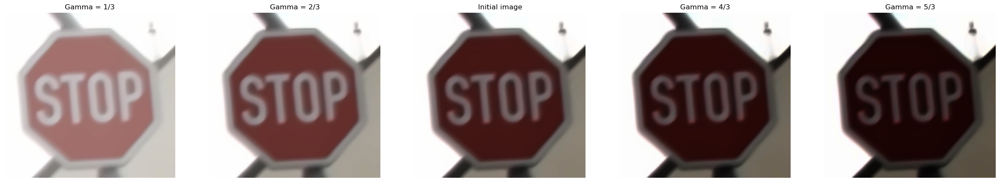

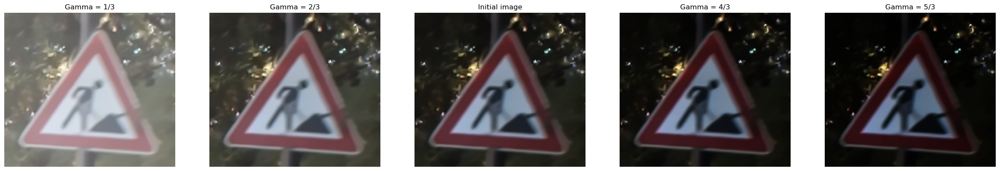

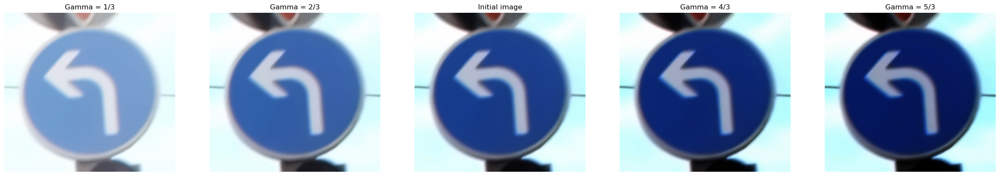

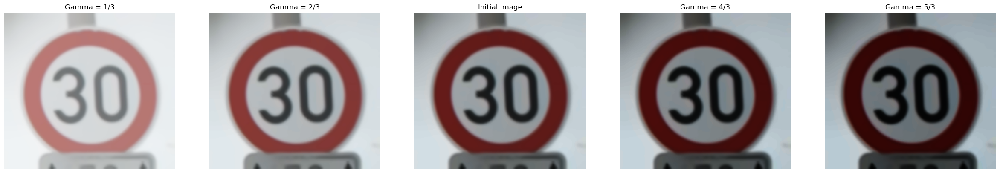

In [50]:
for image in initial_images:
    gamma_tested_images = []
    gamma_image_names = [
        "Gamma = 1/3",
        "Gamma = 2/3",
        "Initial image",
        "Gamma = 4/3",
        "Gamma = 5/3"
    ]
    for i in range(1, 6):
        image_result = apply_transformation(
            image, gamma_correction, [1, i/3]
        )
        gamma_tested_images.append(image_result)
    subplot_images(
        images=gamma_tested_images,
        image_names=gamma_image_names,
        figsize=(30, 7)
    )   

<p style='text-align: justify'>
    Podemos observar que la variación del parámetro <code>&gamma;</code> controla el brillo de las imágenes, y los valores entre 1 y 2 son los más favorables para mejorar su calidad.
<p>

<p style='text-align: justify'>
    Después de realizar varias iteraciones, encontramos que los valores de los parámetros que ofrecen la mejor calidad son <code>a = 1.5</code> y <code>&gamma; = 1.2</code>.
<p>


### **Imágenes preprocesadas**


<p style='text-align: justify'>
    Luego de analizar diferentes métodos y descartar algunos que no aportaron mejoras significativas a nuestras imágenes, concluimos que la corrección gamma es la técnica que ofrece la mejora más notable. Las imágenes preprocesadas, almacenadas en <code>preprocessed_images</code>, son el resultado final de esta etapa del proyecto. Estas imágenes han pasado por un proceso de mejora de resolución, reducción de ruido y corrección gamma, alcanzando así la mejor calidad posible para la siguiente fase del proyecto.
<p>


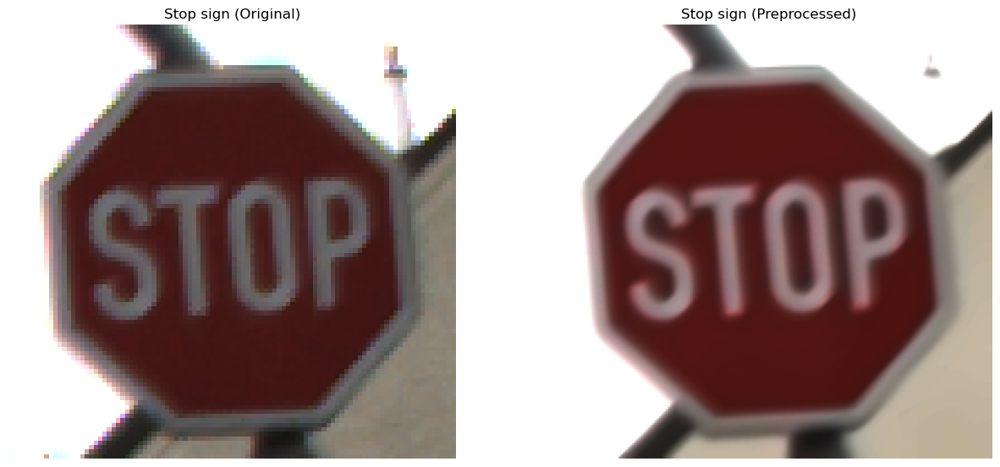

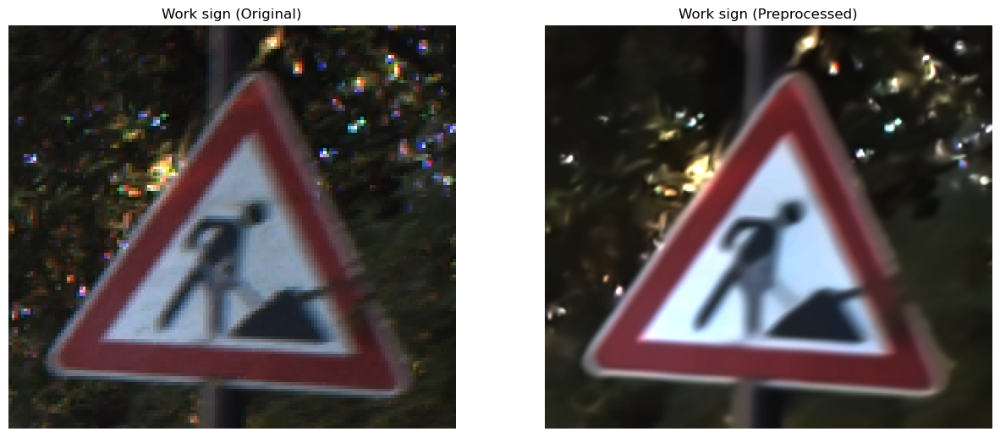

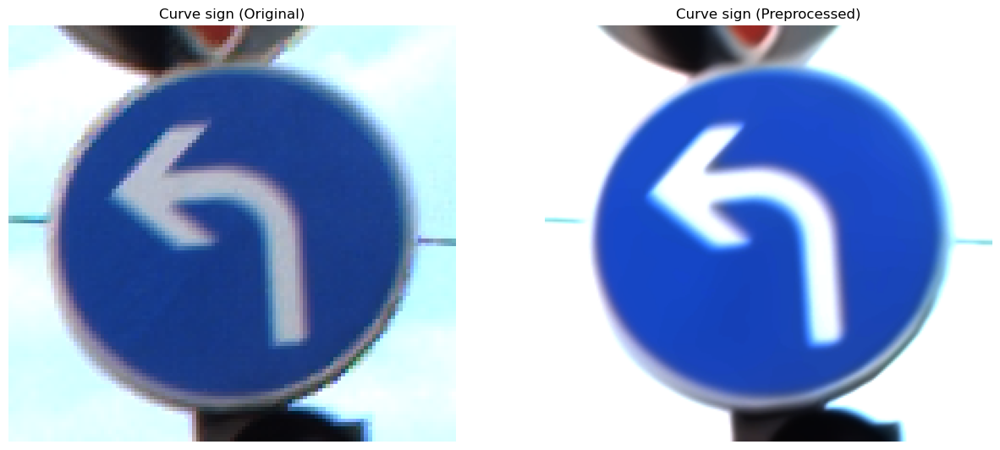

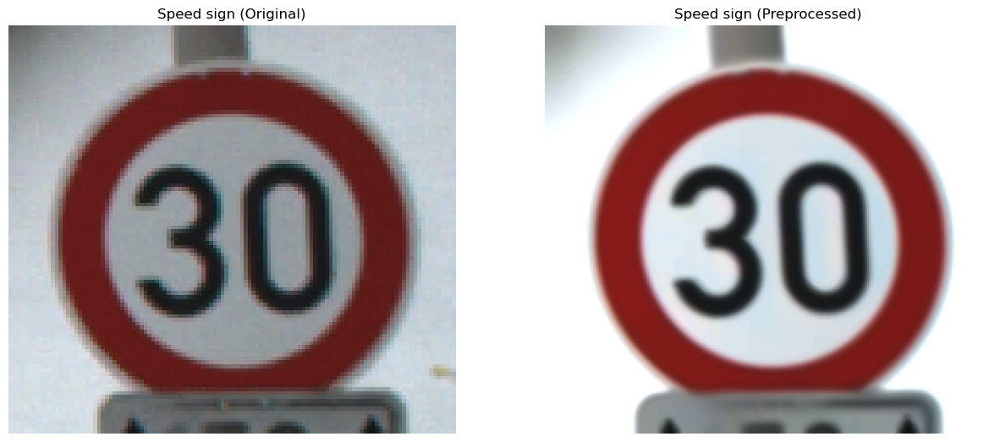

In [51]:
preprocessed_image = list(
    map(
        lambda image: apply_transformation(image, gamma_correction, [1.6, 1.2]),
        initial_images
    )
)
for i in range(len(images_info)):
    subplot_images(
        images=[original_images[i], preprocessed_image[i]],
        image_names=[
            f"{image_names[i]} (Original)", f"{image_names[i]} (Preprocessed)"]
    )


# <center> <h3><strong>Segmentación de imágenes</strong></h3> </center>

<p style='text-align: justify'>
    
<p>

<p style='text-align: justify'>
    Tras completar el preprocesamiento de las imágenes, el siguiente paso crucial es la segmentación, cuyo objetivo es aislar y facilitar la identificación de señales de tránsito y semáforos en cada imagen. Para lograr esto, utilizaremos técnicas avanzadas de umbralización y detección de bordes, que permiten resaltar las características más relevantes de estos elementos en las imágene capturadas. La umbralización permite separar señales de tránsito del fondo de una imagen, convirtiéndola en binaria. Al aplicar un valor de umbral, solo se destacan los píxeles relevantes para el reconocimiento, como los colores los contornos de las señales.
<p>


### **Segmentación mediante umbralización (Thresholding)**

<p style='text-align: justify'>
    Procederemos a cambiar el mapa de color de las imágenes, pasándolas a un formato en escala de grises, esto con el fin de facilitar la tarea de la umbralización de las imágenes, eliminando los canales habituales, y convirtiendo la imagen en una imagen binaria.
<p>


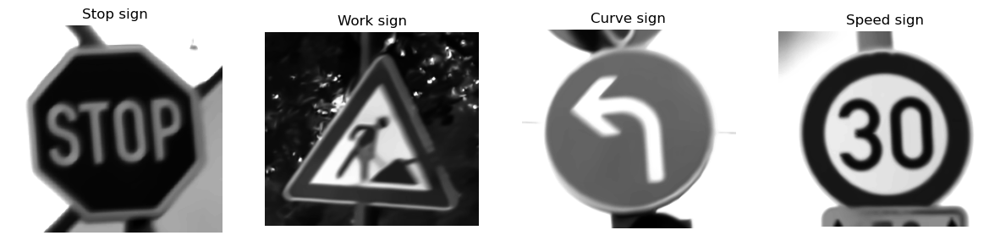

In [52]:
grayscale_images = convert_to_grayscale(preprocessed_image)

subplot_images(
    images=grayscale_images,
    image_names=image_names
)


<p style='text-align: justify'>
    Ahora nos revisaremos en los histogramas de cada imagen para analizar cómo se distribuyen los tonos y, de esta forma, poder elegir mejor los puntos que nos permitan separar señales de tránsito del fondo.
<p>


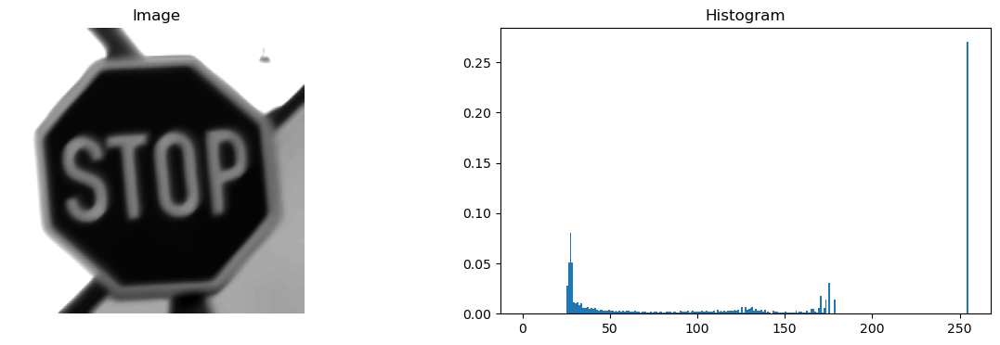

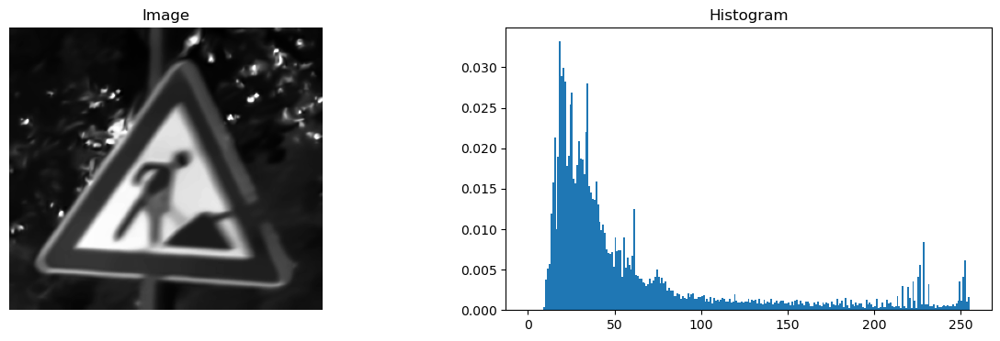

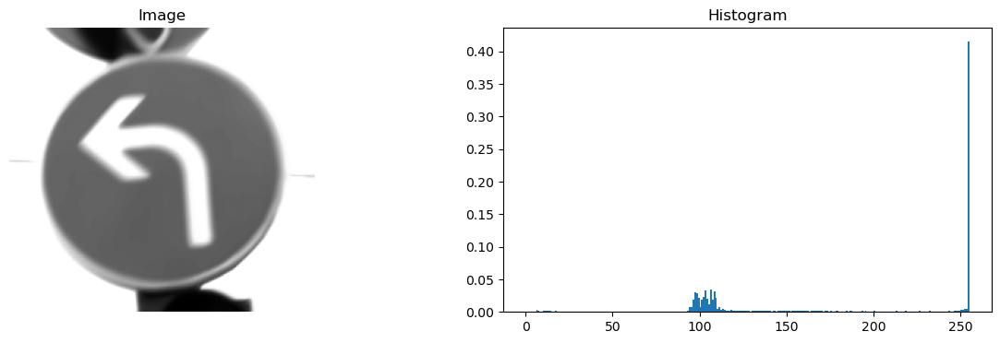

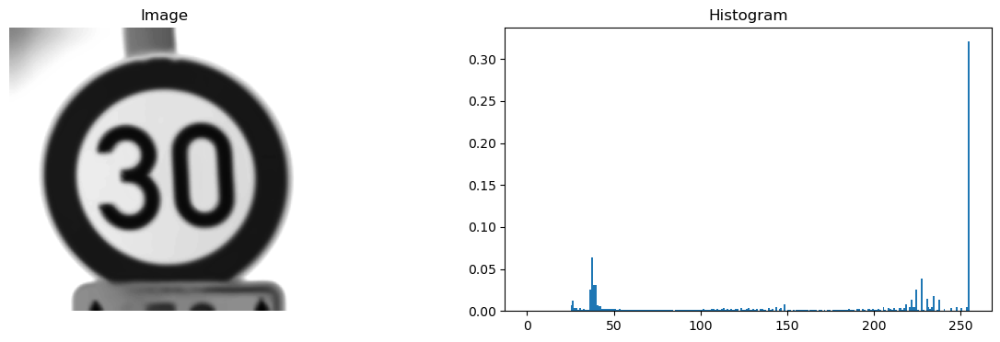

In [53]:
for i in range(len(images_info)):
    plot_image_and_histogram(image=grayscale_images[i],image_title="Image",hist_title="Histogram")


<p style='text-align: justify'>
    Hemos identificado varios picos en el histograma que indican distintas áreas con niveles de intensidad diferenciados en las imágenes. Estos picos nos permiten seleccionar umbrales precisos para segmentar de manera efectiva las características de interés. Una de las imágenes presenta un fondo que dificulta la interpretación clara del histograma, generando una especie de montículo que podría requerir un tratamiento especial más adelante. Esta particularidad sugiere que será necesario aplicar técnicas adicionales para mejorar la segmentación y resaltar mejor los elementos clave en esa imagen.
<p>


<p style="text-align: justify">
    Después de analizar cada histograma, asignaremos manualmente los valores de umbral para cada imagen y procederemos con la segmentación. Utilizaremos la función <code>simple_thresholding</code> para realizar una umbralización binaria básica, y la función <code>adaptative_thresholding</code>, que ajustará dinámicamente el umbral según las variaciones en la imagen.
</p>



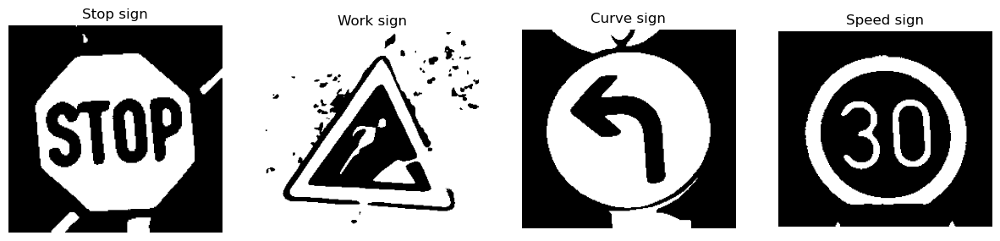

In [54]:
manual_thresholds = [55,75,135,40]

simple_thresholding_images = list(
    map(
        lambda image, threshold: simple_thresholding(image, threshold, cv2.THRESH_BINARY_INV),
        grayscale_images,
        manual_thresholds
    )
)

subplot_images(
    images=simple_thresholding_images,
    image_names=image_names
)


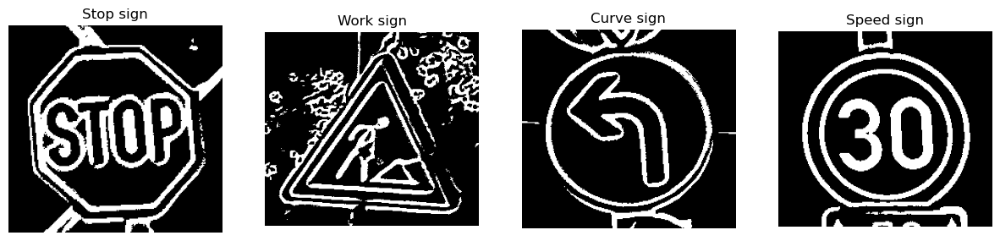

In [55]:
adaptative_thresholding_images = list(
    map(
        lambda image: adaptative_thresholding(image, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 13, 4),
        grayscale_images
    )
)

subplot_images(
    images=adaptative_thresholding_images,
    image_names=image_names
)


## Conclusion - Analisis de estas imagenes !!!

### **Detección de bordes con Canny**

<p style="text-align: justify">
    A continuación, aplicaremos el operador Canny, una herramienta para la detección de bordes en nuestras imágenes. Este método nos permitirá resaltar los contornos de las señales de tránsito, facilitando su identificación y separación del fondo. Al combinar este operador con las técnicas de umbralización previamente aplicadas, mejoraremos significativamente la precisión de la segmentación y detección de los elementos clave en las imágenes.
</p>


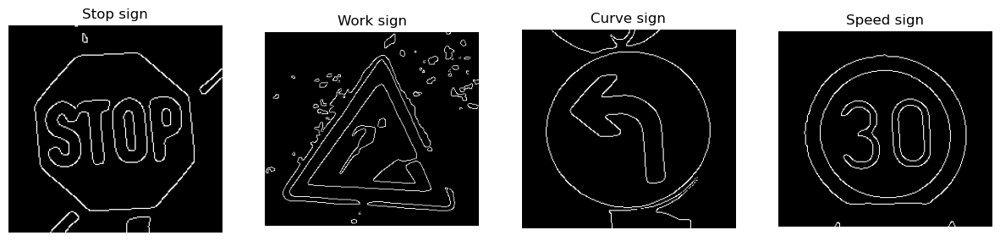

In [56]:
canny_images = list(
    map(
        lambda image: canny_edge_detection(image, 100, 200),
        simple_thresholding_images
    )
)

subplot_images(
    images=canny_images,
    image_names=image_names
)

<p style="text-align: justify">
    Hemos identificado un problema con una de las imágenes, específicamente la denominada "Work Sign". Para mejorar su calidad, aplicaremos una técnica de dilatación con el objetivo de eliminar elementos no deseados que están interfiriendo en la imagen. Este proceso nos permitirá comprobar si logramos limpiar el ruido y obtener una segmentación más clara.
</p>


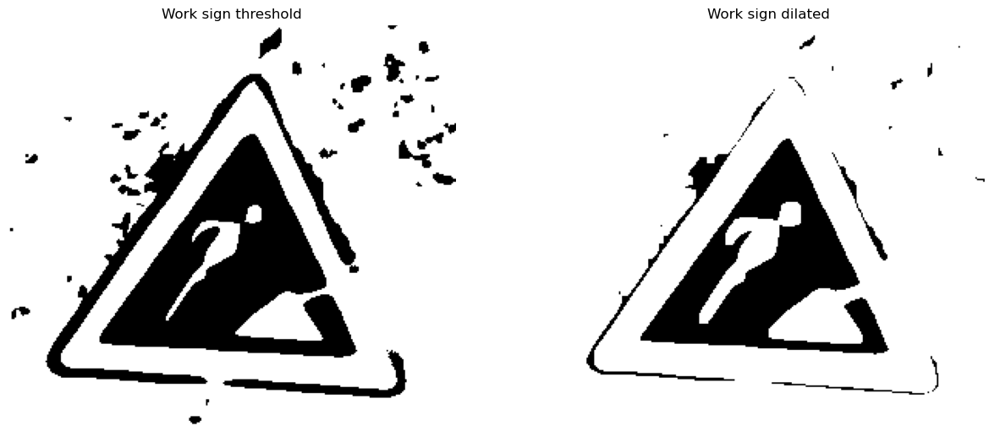

In [57]:
work_sign_threshold = simple_thresholding_images[1]

kernel = np.ones((3, 3), np.uint8)  
work_sign_dilated = dilate_image(work_sign_threshold, kernel, 2)

subplot_images (
    images=[work_sign_threshold, work_sign_dilated],
    image_names=["Work sign threshold", "Work sign dilated"]
)


Una vez mejorada la imagen, volvemos a utilizar el operador Canny para hallar los bordes de nuestra nueva imagen dilatada, y comparamos el resultado anterior con el nuevo.

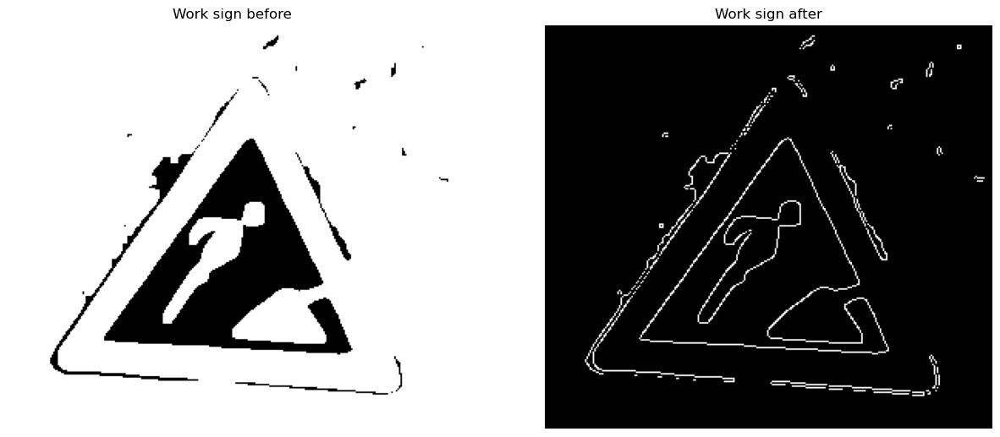

In [58]:
work_sign_edge_detection = canny_edge_detection(work_sign_dilated, 100, 200)

subplot_images(
    images=[work_sign_dilated, work_sign_edge_detection],
    image_names=["Work sign before", "Work sign after"]
)


# Modelo de clasificación

<p style='text-align: justify'>
Después de leer en la literatura se recomienda el uso de redes neuronales convolucionales, en estas redes no se utiliza la extracción de características comúnn (cómo por ejemplo en los SVM), sino que estos a partir de un input van extrayendo la información relevante. Por tanto, la parte de segmentación se dejará para posteriores referencias por si se desea utilizar uno de los modelos que sí utilicen estas características.
<p>

## Cargar las imágenes

In [62]:
# Inicializamos las listas para almacenar los datos y las etiquetas
data = []
labels = []
classes = 43

# Ruta al directorio donde se encuentran las imágenes

# Ruta actual del notebook
cur_path = os.getcwd()  
# Ruta donde están las 43 clases
train_path = '/datasets/data-traffic-sign/Train'

# Iteramos sobre cada una de las clases (43 directorios)
for i in range(classes):
    # Definir la ruta para la clase actual
    path = os.path.join(train_path, str(i))
    # Listar todas las imágenes dentro del directorio de la clase
    images = os.listdir(path)  

    # Iterar sobre cada imagen dentro de la clase
    for a in images:
        try:
            # Cargar la imagen
            image = Image.open(os.path.join(path, a))
            # Redimensionar la imagen a 30x30 píxeles
            image = image.resize((30, 30))
            # Convertir la imagen a un arreglo de NumPy
            image = np.array(image)
            # Añadir la imagen y la etiqueta a las listas
            data.append(image)
            labels.append(i)
        except Exception as e:
            print(f"Error al cargar la imagen {a}: {e}")

# Convertimos las listas a arreglos de NumPy
data = np.array(data)
labels = np.array(labels)

print(f"Total de imágenes cargadas: {len(data)}")
print(f"Total de etiquetas cargadas: {len(labels)}")

Total de imágenes cargadas: 39209
Total de etiquetas cargadas: 39209


## Verificar la carga de datos

In [63]:
# Revisar la forma (shape) de los datos y las etiquetas
print(data.shape, labels.shape)

# Dividir el dataset en conjuntos de entrenamiento (80%) y prueba (20%)
X_train, X_test, y_train, y_test = train_test_split(data, labels,
                                                    test_size=0.2,
                                                    random_state=42)

# Mostrar la forma de los conjuntos tras la división
print(f"Forma de X_train: {X_train.shape}, X_test: {X_test.shape}")
print(f"Forma de y_train: {y_train.shape}, y_test: {y_test.shape}")

# Convertir las etiquetas en formato de codificación one-hot (43 clases)
y_train = to_categorical(y_train, 43)
y_test = to_categorical(y_test, 43)

# Revisar la nueva forma de las etiquetas tras la codificación one-hot
print(f"Forma de y_train (one-hot): {y_train.shape}, y_test (one-hot): {y_test.shape}")

(39209, 30, 30, 3) (39209,)
Forma de X_train: (31367, 30, 30, 3), X_test: (7842, 30, 30, 3)
Forma de y_train: (31367,), y_test: (7842,)
Forma de y_train (one-hot): (31367, 43), y_test (one-hot): (7842, 43)


## Compilación del modelo

In [64]:
# Construcción del modelo
model = Sequential()
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu',
                 input_shape=X_train.shape[1:]))
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(43, activation='softmax'))

# Compilacion del modelo
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 22, 22, 32)        25632     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 11, 11, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 11, 11, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 9, 9, 64)          18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 7, 7, 64)          36928     
                                                        

2024-09-23 16:19:05.100932: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


## Entrenamiento del modelo

In [65]:
# Establecer el uso de la GPU
with tf.device('/GPU:0'):
    epochs = 15  # Número de épocas
    batch_size = 32  # Tamaño del lote

    # Entrenamiento del modelo
    history = model.fit(X_train, y_train, 
                        batch_size=batch_size, 
                        epochs=epochs, 
                        validation_data=(X_test, y_test))

Epoch 1/15
981/981 [==============================] - 142s 144ms/step - loss: 1.7676 - accuracy: 0.5521 - val_loss: 0.3186 - val_accuracy: 0.9137
Epoch 2/15
981/981 [==============================] - 117s 119ms/step - loss: 0.4635 - accuracy: 0.8655 - val_loss: 0.1160 - val_accuracy: 0.9722
Epoch 3/15
981/981 [==============================] - 141s 144ms/step - loss: 0.2833 - accuracy: 0.9180 - val_loss: 0.0596 - val_accuracy: 0.9860
Epoch 4/15
981/981 [==============================] - 142s 145ms/step - loss: 0.2502 - accuracy: 0.9299 - val_loss: 0.0699 - val_accuracy: 0.9811
Epoch 5/15
981/981 [==============================] - 135s 138ms/step - loss: 0.2607 - accuracy: 0.9315 - val_loss: 0.0789 - val_accuracy: 0.9791
Epoch 6/15
981/981 [==============================] - 138s 140ms/step - loss: 0.2083 - accuracy: 0.9461 - val_loss: 0.0383 - val_accuracy: 0.9907
Epoch 7/15
981/981 [==============================] - 140s 143ms/step - loss: 0.2259 - accuracy: 0.9433 - val_loss: 0.0670 -

## Gráficas del Accuracy y Loss

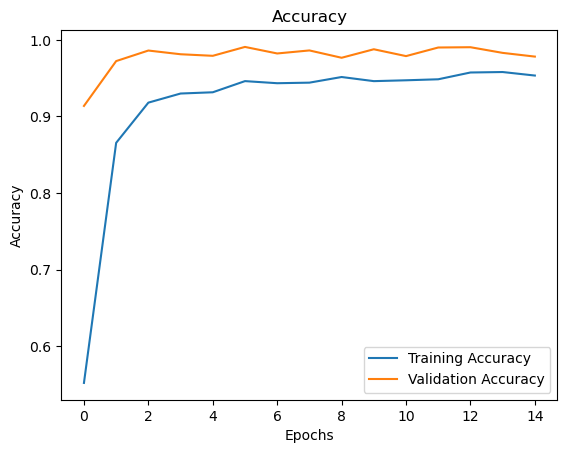

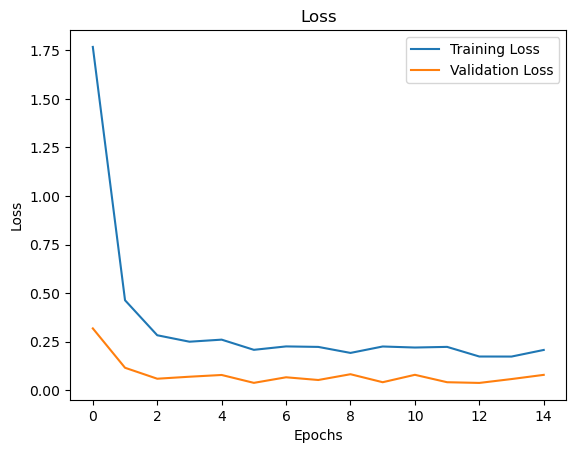

In [66]:
# Gráfico de la precisión (accuracy)
plt.figure(0)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Gráfico de la pérdida (loss)
plt.figure(1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Guardar el modelo

In [67]:
model.save('classifier_GTSR_CNN.h5')

# Análisis de resultados

## Cargar el modelo para el análisis y la matriz de confusión

<p style='text-align: justify'>
Una matriz de confusión es una herramienta cada fila representa la clase real (la señal que realmente es) y cada columna representa la clase predicha (la señal que el modelo cree que es). Los números dentro de la matriz indican la cantidad de veces que una clase real fue clasificada como una clase predicha.

Para los resultados que arroja la matriz de confusión, se puede decir que ene general están bien, puesto que en la diagonal principal se encuentran casi que todos los datos de las imágenes, lo que quiere decir que en general está prediciendo de manera adecuada el modelo. Pero no hay que dejar de tener en cuenta que este es un dataset desequilibrado, por tanto puede influir en el desempeño de ciertas clases.
<p>

246/246 [==============================] - 2s 9ms/step


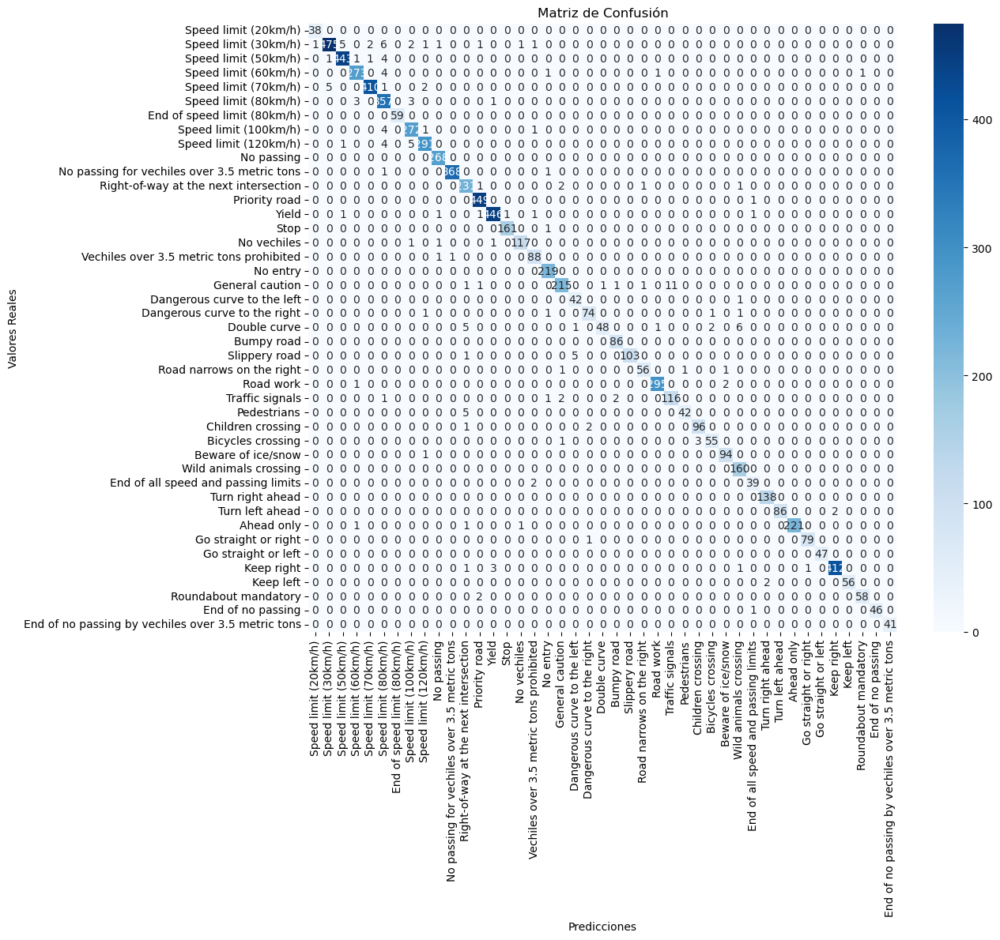

In [68]:
# Cargar el modelo guardado
model = load_model('classifier_GTSR_CNN.h5')

# Realizar predicciones sobre el conjunto de test
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Obtener la clase con la mayor probabilidad

# Realizar predicciones con el modelo sobre el conjunto de test
# Convertir las etiquetas de test (one-hot encoded) a su formato original (clase)
y_true = np.argmax(y_test, axis=1)

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred_classes)

# Graficar la matriz de confusión
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=sign_names['SignName'], yticklabels=sign_names['SignName'])
plt.title('Matriz de Confusión')
plt.xlabel('Predicciones')
plt.ylabel('Valores Reales')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

## Métricas de desempeño

### Preparación para el cálculo de las métricas

In [69]:
# Cargar el modelo previamente guardado
model = tf.keras.models.load_model('classifier_GTSR_CNN.h5')

# Realizar predicciones con el modelo sobre el conjunto de test
y_pred_probs = model.predict(X_test)

# Convertir las probabilidades predichas en etiquetas de clases
y_pred = np.argmax(y_pred_probs, axis=1)

# Si las etiquetas de y_test están en formato one-hot, conviértalas a etiquetas
y_true = np.argmax(y_test, axis=1)

246/246 [==============================] - 3s 10ms/step


### Recall
<p style='text-align: justify'>
El recall mide la capacidad del modelo para identificar correctamente las instancias positivas entre todas las instancias que realmente son positivas. Por tanto, un recall alto significa que el modelo está capturando la mayoría de las instancias positivas (clase de interés).

En el caso de la clasificación de señales de tráfico, es de interés debido a qué interesa que el modelo detecte todas las señales importantes.

Para los resultados de este modelo, se denota que el recall está capturando adecuadamente las clases de interés.
<p>

In [70]:
# Calcular el recall por clase
recall = recall_score(y_true, y_pred, average=None)  # 'None' para calcular el recall para cada clase

/tmp/ipykernel_17/2482049595.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Clase', y='Recall', data=recall_df, palette='viridis')


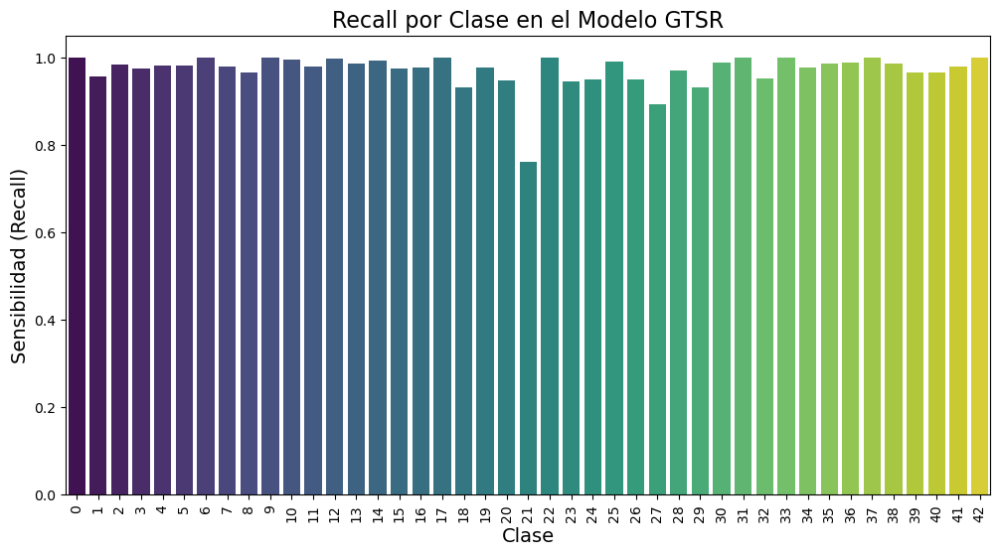

In [71]:
# Crear un DataFrame para organizar los resultados
recall_df = pd.DataFrame({'Clase': range(len(recall)), 'Recall': recall})

# Graficar el recall por clase usando Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='Clase', y='Recall', data=recall_df, palette='viridis')

# Añadir título y etiquetas
plt.title('Recall por Clase en el Modelo GTSR', fontsize=16)
plt.xlabel('Clase', fontsize=14)
plt.ylabel('Sensibilidad (Recall)', fontsize=14)
plt.xticks(rotation=90)  # Rotar las etiquetas si hay muchas clases

# Mostrar la gráfica
plt.show()

### Precisión positiva

<p style='text-align: justify'>
La precisión positiva mide la proporción de verdaderos positivos respecto a todas las instancias que fueron clasificadas como positivas. Un alto valor de precisión indica que cuando el modelo predice que una instancia es positiva, es muy probable que esté en lo correcto.

En la clasificación de señales, si el modelo predice que una señal es de "Pare", interesa que esta predicción sea confiable (y que no prediga "Pare" cuando no es).

Para este caso, la precisión por clase parece ser adecuada.
<p>

In [72]:
# Calcular la precisión por clase
precision = precision_score(y_true, y_pred, average=None)  # 'None' para calcular la precisión por clase

/tmp/ipykernel_17/1530126211.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Clase', y='Precisión', data=precision_df, palette='magma')


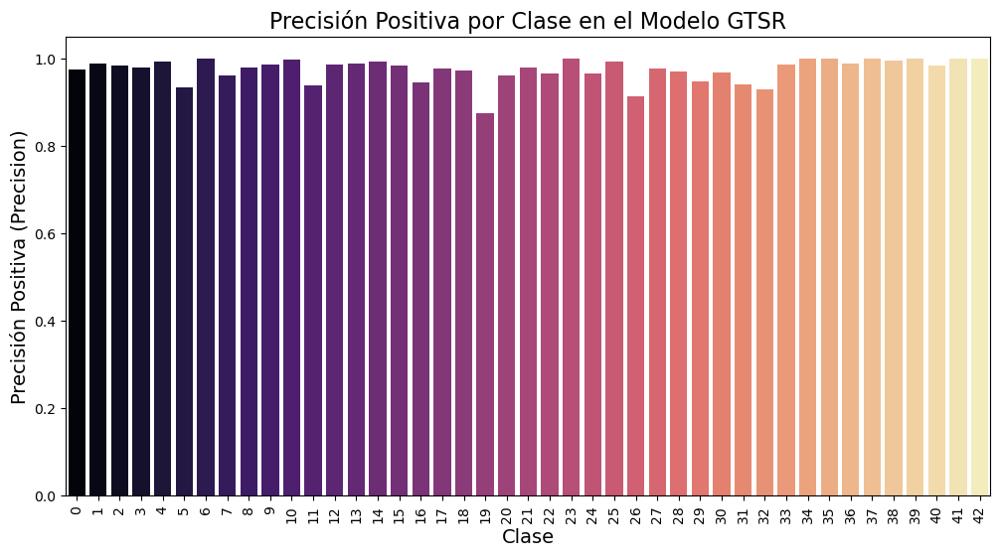

In [73]:
# Crear un DataFrame para organizar los resultados
precision_df = pd.DataFrame({'Clase': range(len(precision)), 'Precisión': precision})

# Graficar la precisión por clase usando Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='Clase', y='Precisión', data=precision_df, palette='magma')

# Añadir título y etiquetas
plt.title('Precisión Positiva por Clase en el Modelo GTSR', fontsize=16)
plt.xlabel('Clase', fontsize=14)
plt.ylabel('Precisión Positiva (Precision)', fontsize=14)
plt.xticks(rotation=90)  # Rotar las etiquetas si hay muchas clases

# Mostrar la gráfica
plt.show()

### F1-Score

<p style='text-align: justify'>
El F1-Score es la media armónica entre la precisión y el recall. Se utiliza cuando se quiere encontrar un balance entre ambas métricas. El F1-Score es útil cuando hay **desequilibrio de clases**. Si el modelo tiene un buen desempeño tanto en la precisión como en el recall, el F1-Score será alto. Si el modelo falla en una de estas métricas, el F1-Score será más bajo. Es especialmente útil cuando necesitas equilibrar la importancia de los falsos positivos y los falsos negativos.

En la clasificación de señales de tráfico, el F1-Score ayudaría a evaluar el rendimiento general del modelo cuando es igual de importante predecir correctamente tanto las señales como no equivocarse en las que no lo son.

En este caso, parece que el F1-Score por clase es adecuado.
<p>

In [74]:
# Calcular el F1-Score por clase
f1 = f1_score(y_true, y_pred, average=None)  # 'None' para obtener el F1-Score por clase

/tmp/ipykernel_17/4166176232.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Clase', y='F1-Score', data=f1_df, palette='coolwarm')


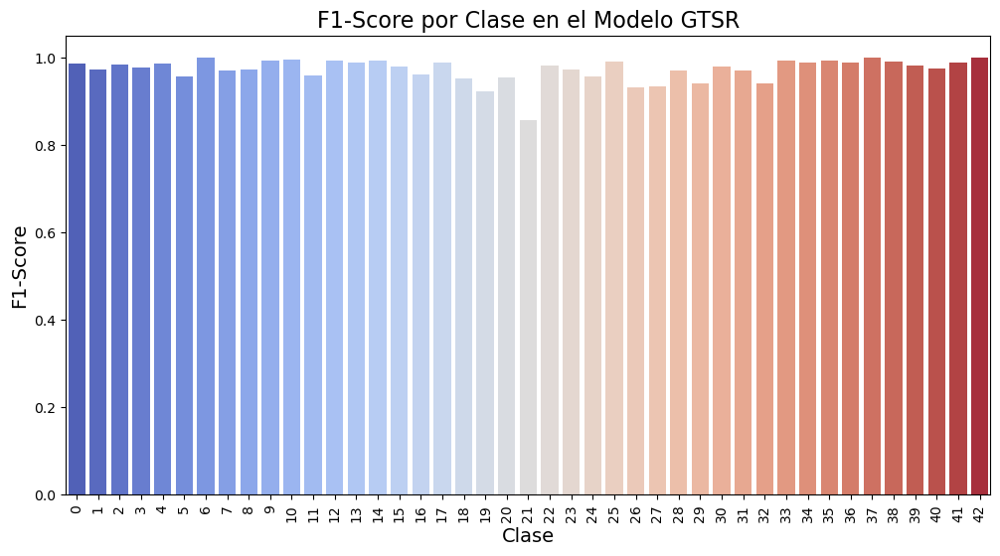

In [75]:
# Crear un DataFrame para organizar los resultados
f1_df = pd.DataFrame({'Clase': range(len(f1)), 'F1-Score': f1})

# Graficar el F1-Score por clase usando Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='Clase', y='F1-Score', data=f1_df, palette='coolwarm')

# Añadir título y etiquetas
plt.title('F1-Score por Clase en el Modelo GTSR', fontsize=16)
plt.xlabel('Clase', fontsize=14)
plt.ylabel('F1-Score', fontsize=14)
plt.xticks(rotation=90)  # Rotar las etiquetas si hay muchas clases

# Mostrar la gráfica
plt.show()

### Accuracy
<p style='text-align: justify'>
El accuracy mide la proporción de predicciones correctas sobre el total de predicciones realizadas. Un accuracy alto significa que, en general, el modelo está haciendo un buen trabajo al clasificar tanto instancias positivas como negativas. Sin embargo, en datasets desequilibrados, el accuracy puede ser engañoso, ya que el modelo podría simplemente aprender a predecir siempre la clase mayoritaria y aún así tener un accuracy alto.

En este caso, parece que el Accuracy por clase es adecuado.
<p>

/tmp/ipykernel_17/3020328501.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Clase', y='Accuracy', data=accuracy_df, palette='coolwarm')


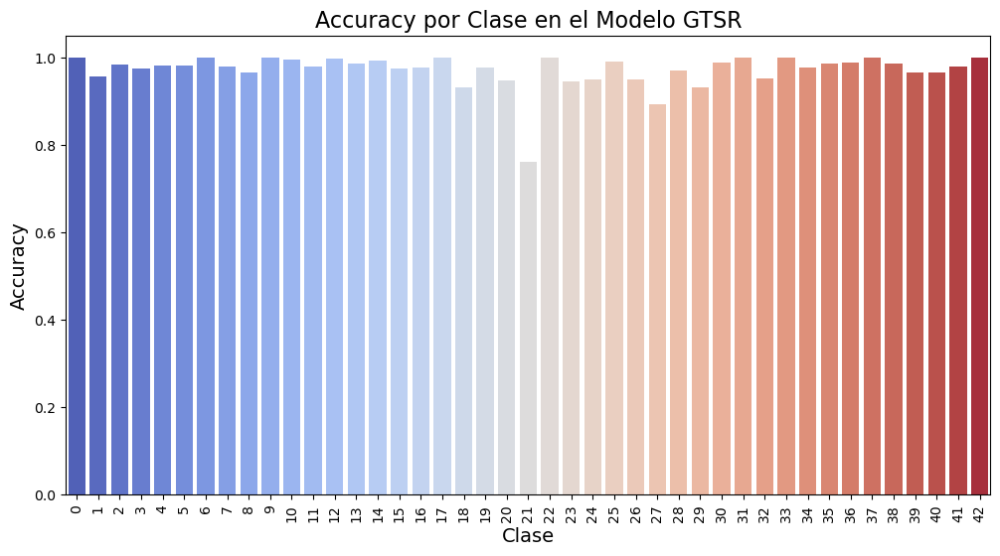

In [76]:
# Calcular el accuracy por clase manualmente
accuracies = []
for i in range(len(np.unique(y_true))):  # Iterar sobre cada clase
    # Seleccionar las predicciones y etiquetas reales de la clase actual
    idx = np.where(y_true == i)
    accuracy = accuracy_score(y_true[idx], y_pred[idx])
    accuracies.append(accuracy)

# Crear un DataFrame para organizar los resultados
accuracy_df = pd.DataFrame({'Clase': range(len(accuracies)), 'Accuracy': accuracies})

# Graficar el accuracy por clase usando Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='Clase', y='Accuracy', data=accuracy_df, palette='coolwarm')

# Añadir título y etiquetas
plt.title('Accuracy por Clase en el Modelo GTSR', fontsize=16)
plt.xlabel('Clase', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(rotation=90)  # Rotar las etiquetas si hay muchas clases

# Mostrar la gráfica
plt.show()

# Conclusión

El modelo presentado, con un mínimo de procesamiento, puesto que sólo se utilizó realmente un resize a las imágenes arrojo buenos resultados teoricos. Pero estos resultados pueden diferir bastante si se utilizan en el mundo real. Esto debido a que las condiciones de las imágenes pueden diferir bastante.

Este modelo tiene bastante deficiencias, puesto que se puede mejorar en el apartado del equilibrio del dataset, utilizando técnicas de data augmentation como rotaciones, traslaciones y homografía para equilibrar el dataset.

También es importante recalcar el hecho del procesamiento de las imágenes y de la segmentación de estas para el uso de otros modelos, pero como se mencionó, ahora mismo para la clasificación manda la parada las redes neuronales.